In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys

In [3]:
root_dir = os.path.abspath(os.path.join(os.getcwd(), '..', '..'))
sys.path.append(root_dir)

In [4]:
from src.activation_dataset import ActivationDataset

In [5]:
from src.pca_analyzer import PCAAnalyzer

In [6]:
dataset = ActivationDataset()

In [7]:
CHECKPOINT_DIR = root_dir + '/ckpts/2025-02-13_09-26-08'
dataset.load(os.path.join(CHECKPOINT_DIR, 'strong_activation_dataset.pkl'))

In [8]:
pca_analyzer = PCAAnalyzer()

In [9]:
n_components = 5

In [10]:
from utils.base_feature_extractor import get_all_feature_keys
features = get_all_feature_keys()

## General Analysis (all layers and phases)

In [11]:
layer_names = ['actor_mlp_1', 'actor_mlp_3', 'actor_mlp_5']

In [12]:
pca_results = pca_analyzer.run_pca(dataset, n_components=n_components, layer_names=layer_names)
print(f"Explained variance ratio: {pca_results['explained_variance_ratio']}")
print(f"Total explained variance: {pca_results['explained_variance_ratio'].sum():.2f}")

Explained variance ratio: [0.42843306 0.23939197 0.11895715 0.06159599 0.04160984]
Total explained variance: 0.89


In [13]:
from src.pca_visualizer import PCAVisualizer
visualizer = PCAVisualizer()

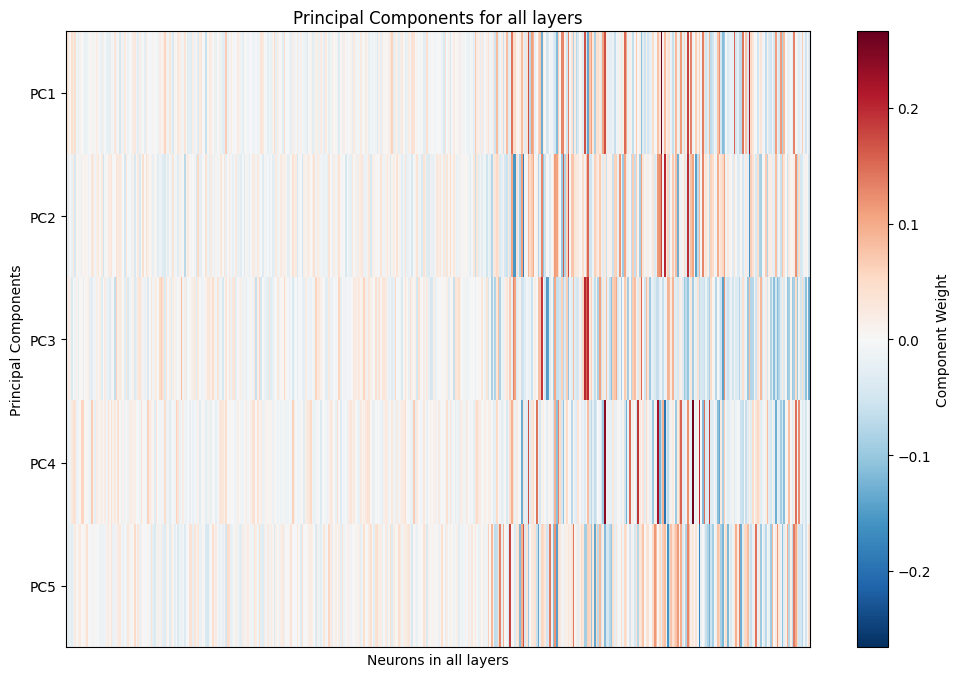

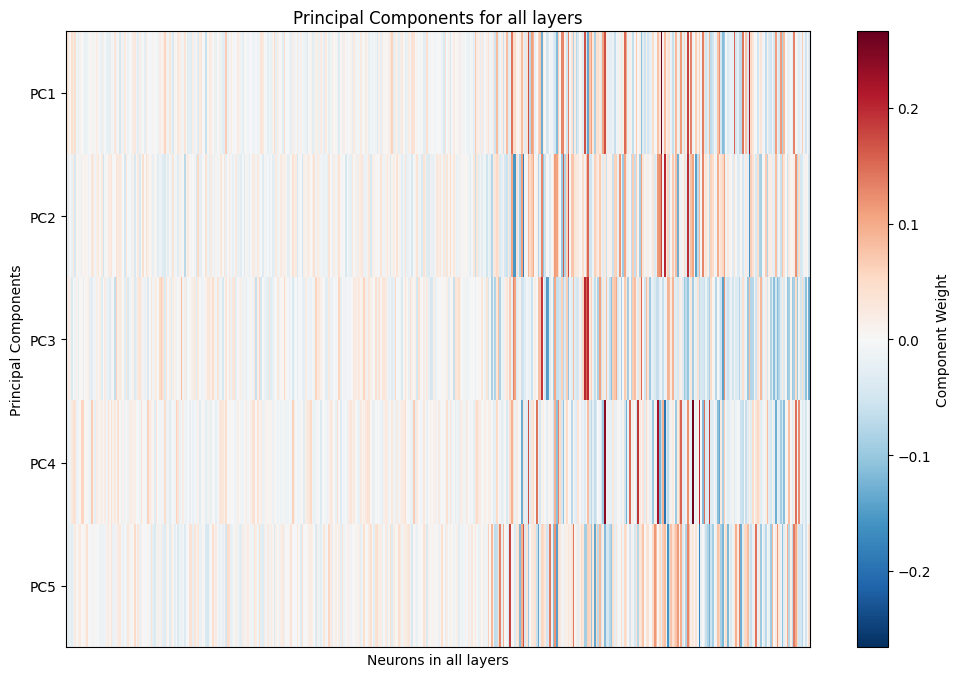

In [14]:
visualizer.plot_pca_components(pca_results['components'], "all layers")

since the neurons are ordered by layers, this immediately tells us that later layers capture a larger part of the variance!

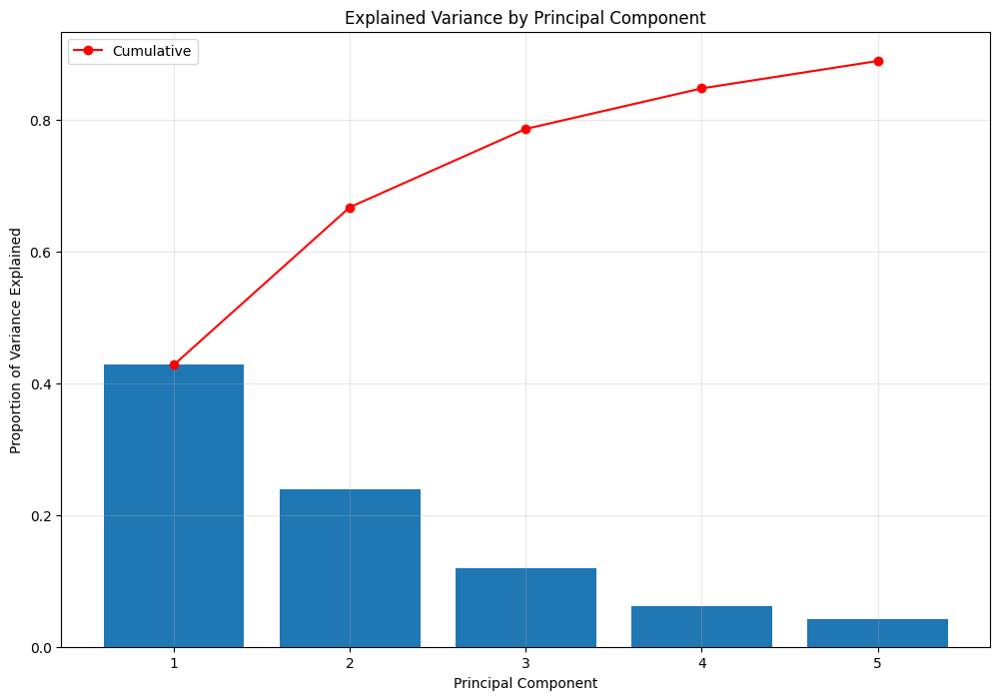

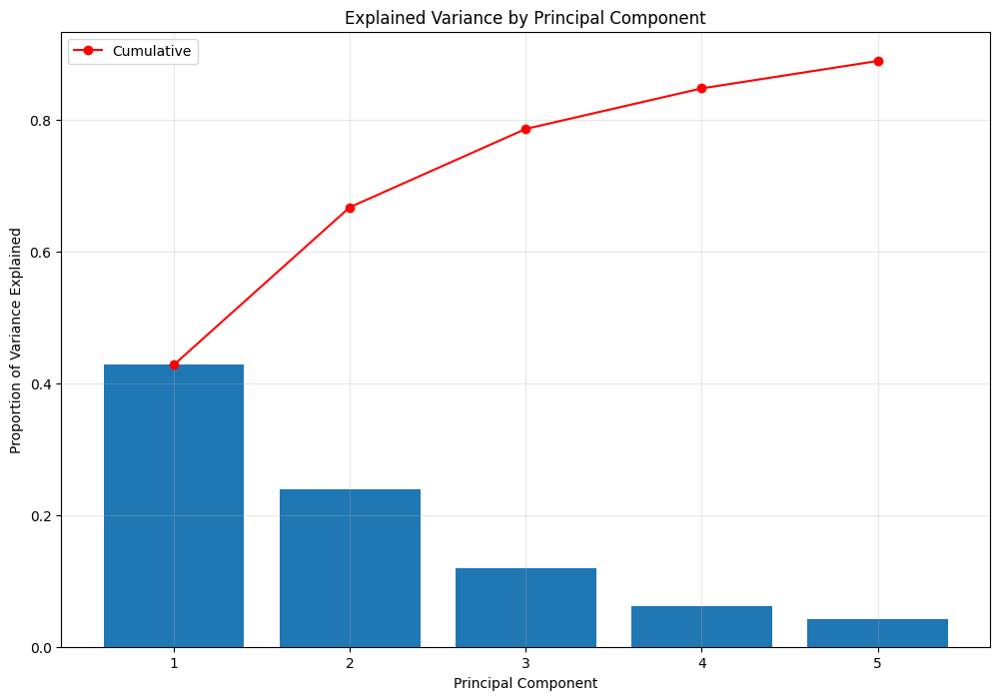

In [15]:
visualizer.plot_explained_variance(pca_results['explained_variance_ratio'])

In [16]:
projected_activations = pca_analyzer.project_activations(dataset, pca_results['pca_model'], layer_names=layer_names)

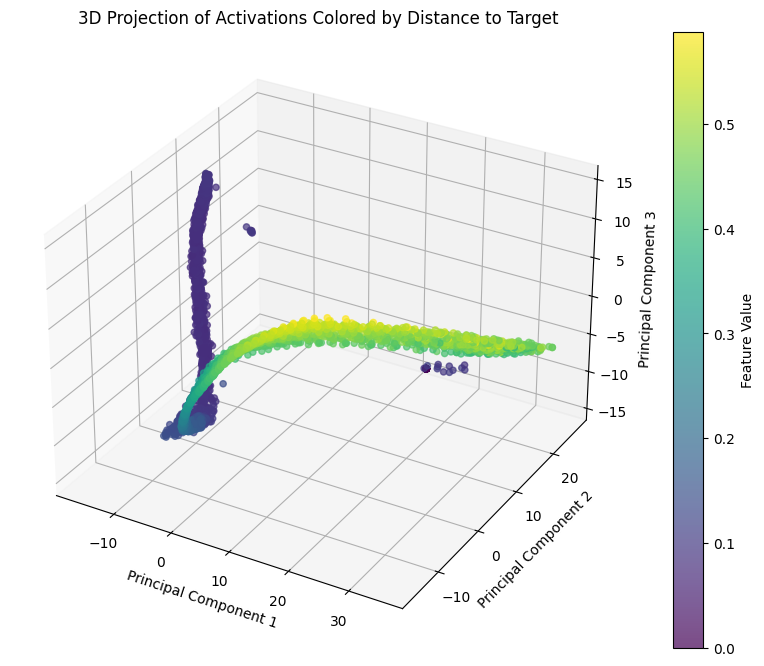

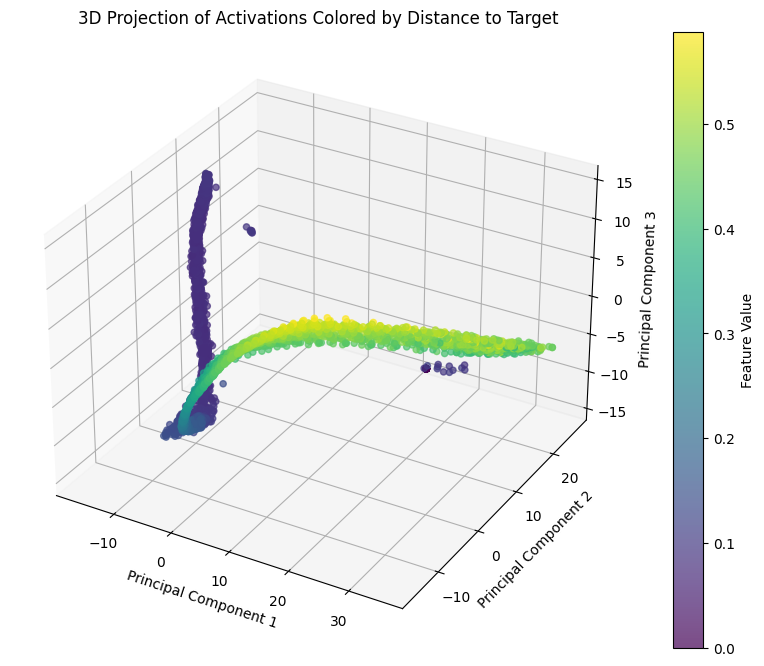

In [22]:
visualizer.plot_3d_projected_activations(
    projected_activations, 
    feature_values=dataset.get_flattened_feature('distance'),
    title="3D Projection of Activations Colored by Distance to Target"
)

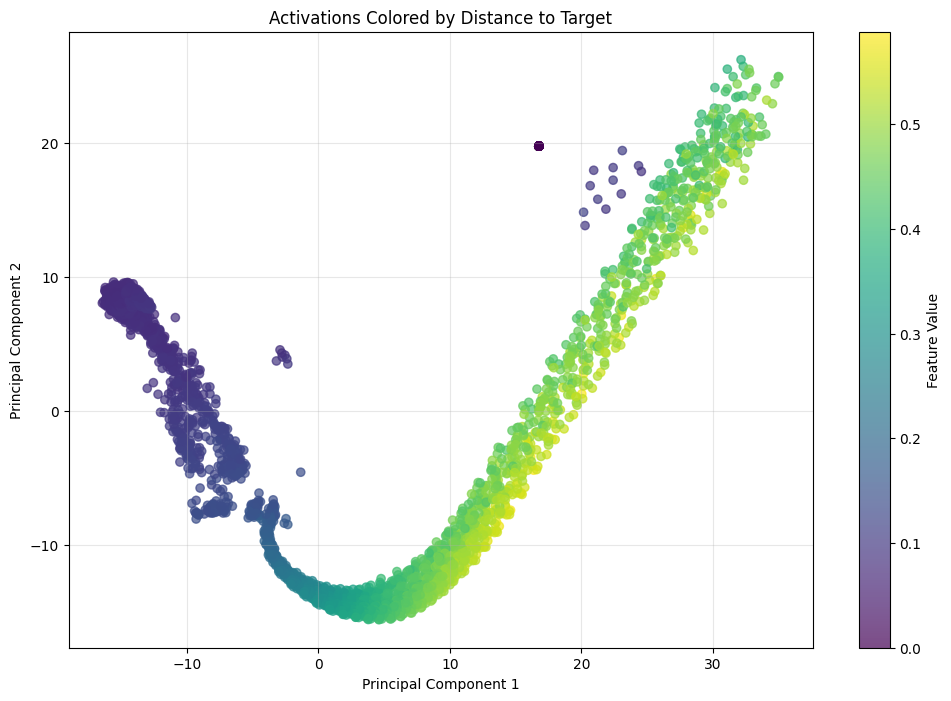

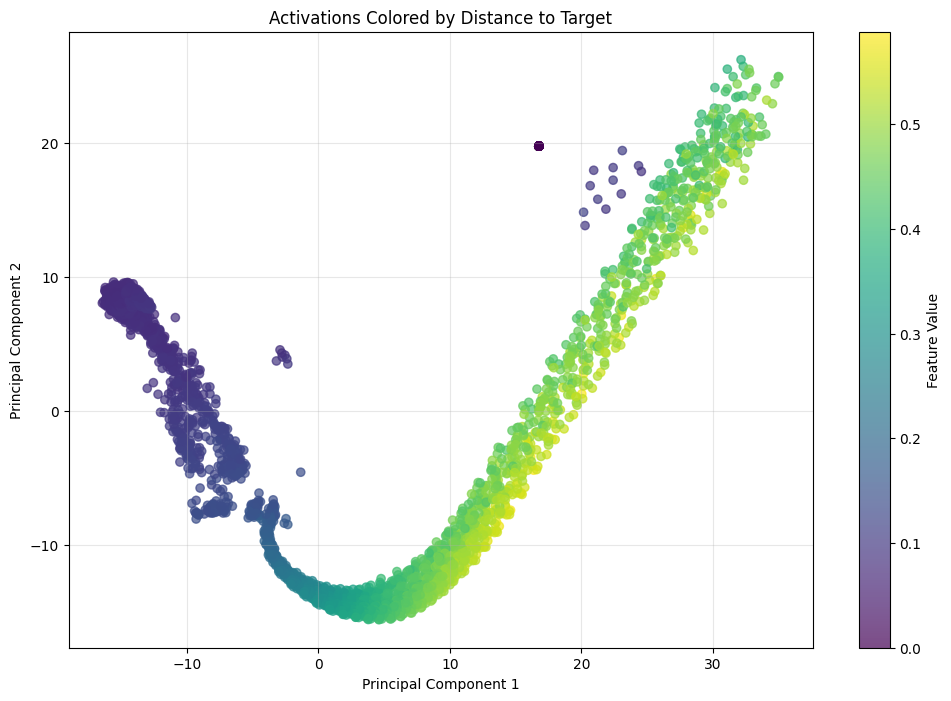

In [17]:
visualizer.plot_projected_activations_by_feature(
    projected_activations, 
    dataset.get_flattened_feature('distance'),
    title="Activations Colored by Distance to Target"
)

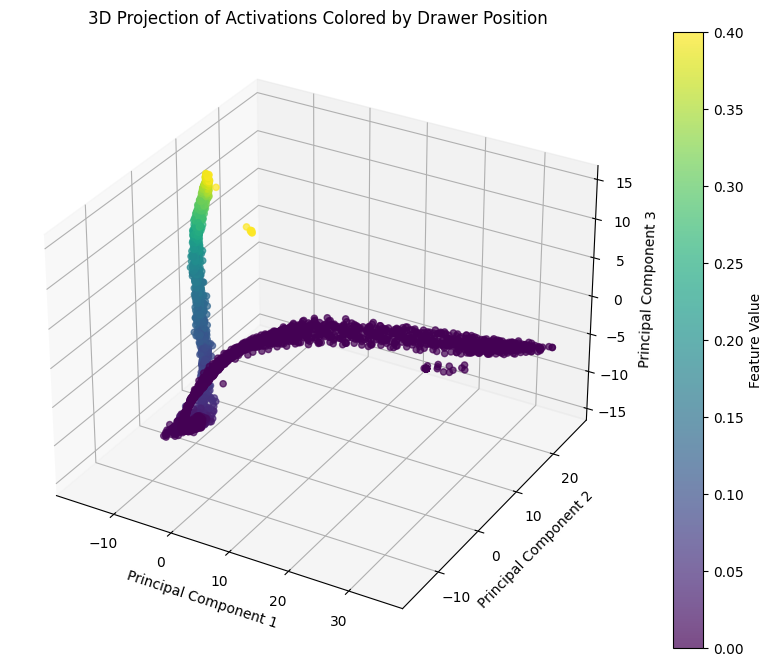

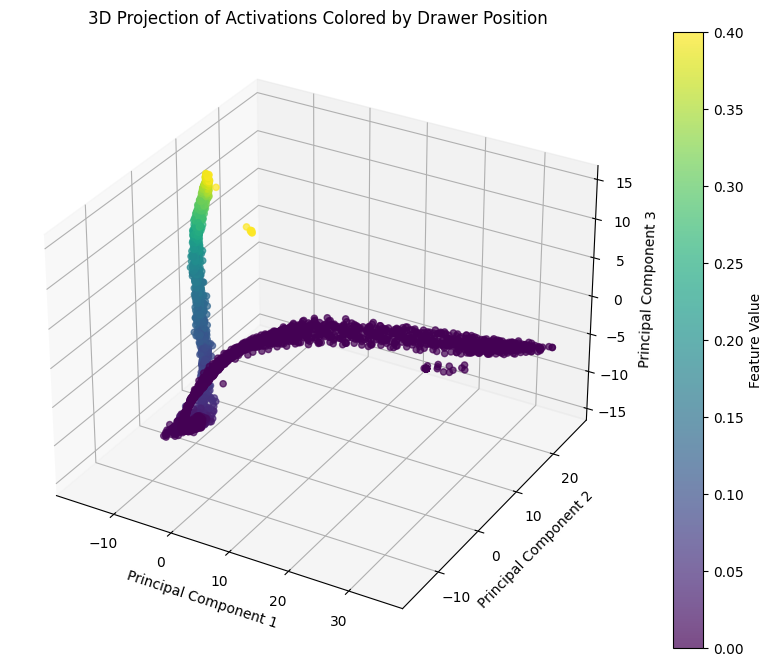

In [23]:
visualizer.plot_3d_projected_activations(
    projected_activations, 
    feature_values=dataset.get_flattened_feature('drawer_position'),
    title="3D Projection of Activations Colored by Drawer Position"
)

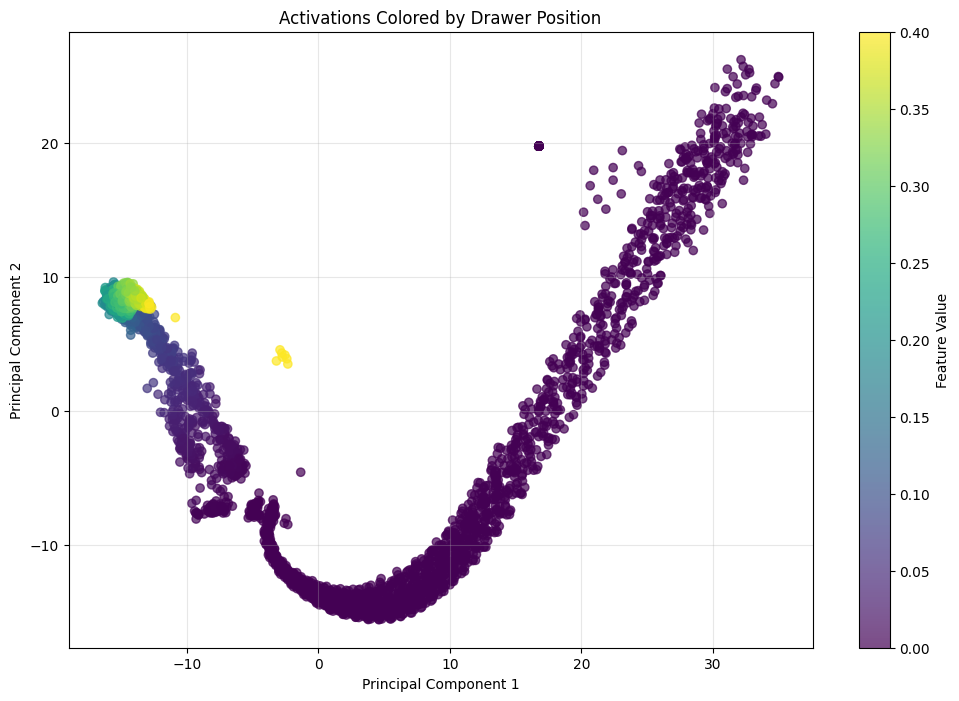

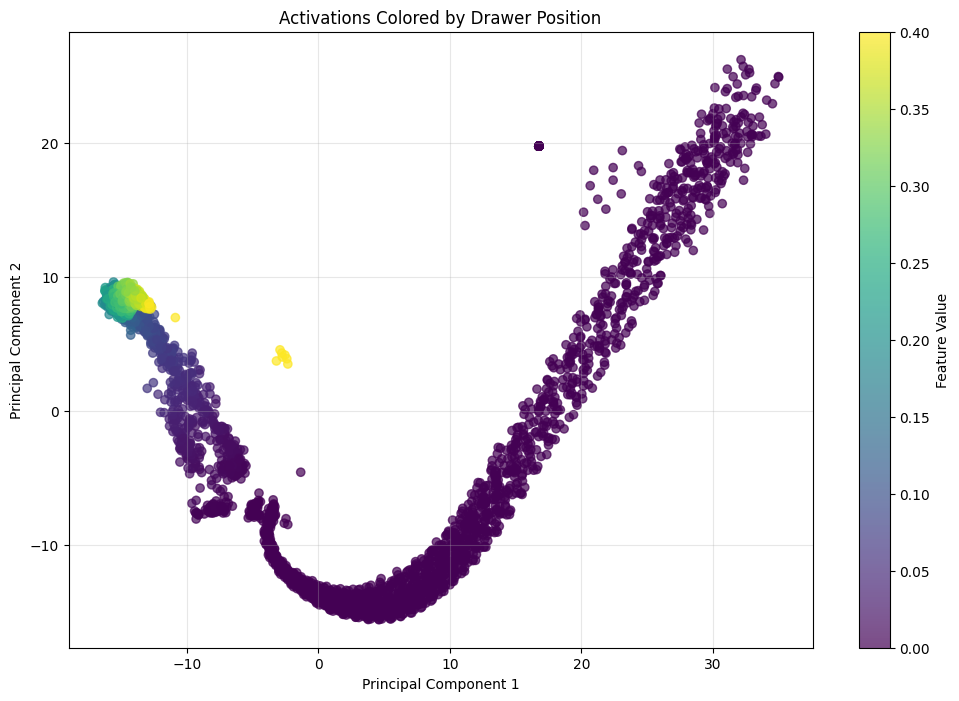

In [18]:
visualizer.plot_projected_activations_by_feature(
    projected_activations, 
    feature_values=dataset.get_flattened_feature('drawer_position'),
    title="Activations Colored by Drawer Position"
)

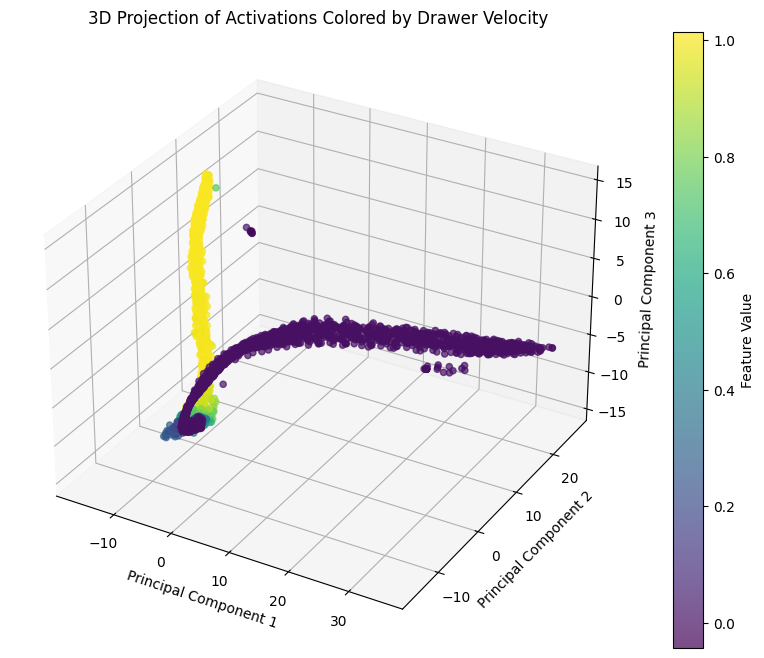

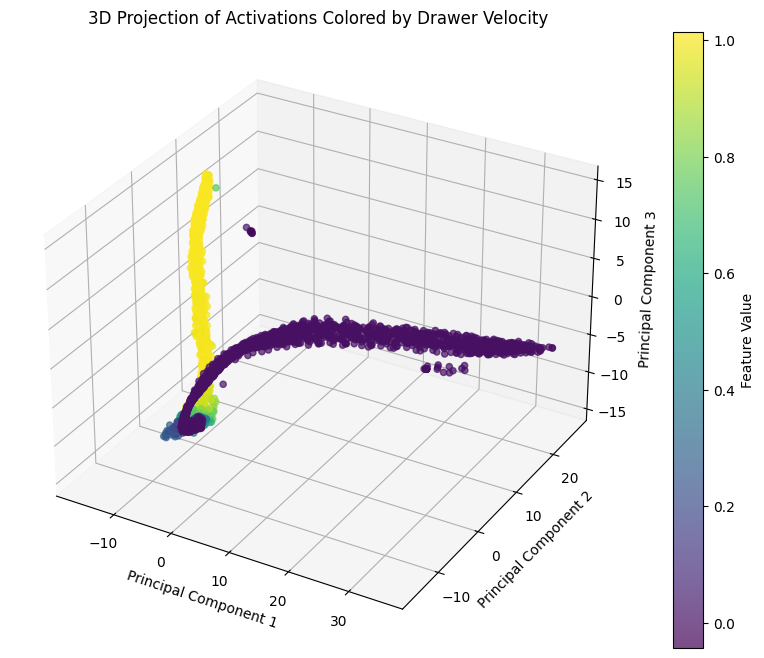

In [24]:
visualizer.plot_3d_projected_activations(
    projected_activations, 
    feature_values=dataset.get_flattened_feature('drawer_velocity'),
    title="3D Projection of Activations Colored by Drawer Velocity"
)

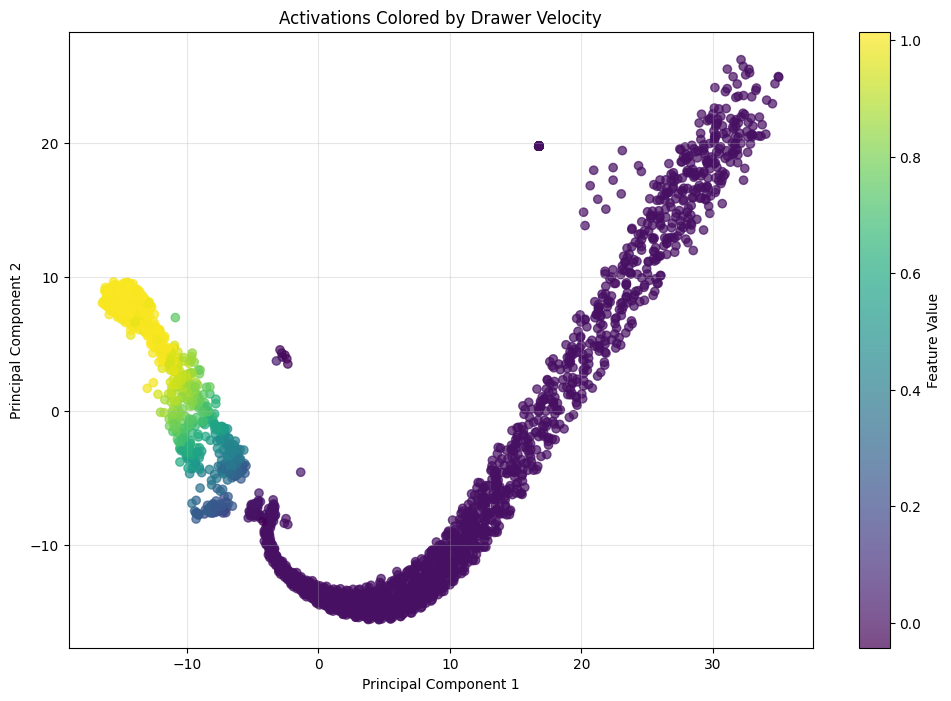

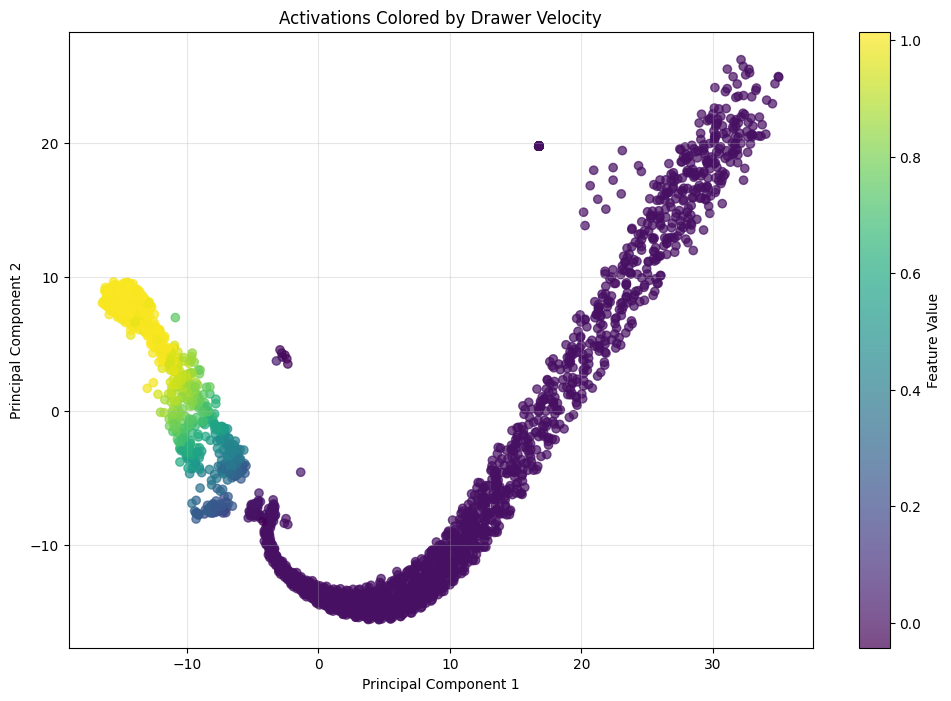

In [19]:
visualizer.plot_projected_activations_by_feature(
    projected_activations, 
    feature_values=dataset.get_flattened_feature('drawer_velocity'),
    title="Activations Colored by Drawer Velocity"
)

- we can see that the areas corresponding to high feature values for distance is different from that of drawer attributes. 
- the area corresponding to drawer position is a subset of that of drawer velocity, and is in a very small area (guess: these neurons care most about ensuring the initial pull, i.e. drawer position above zero, and beyond that might not matter?)

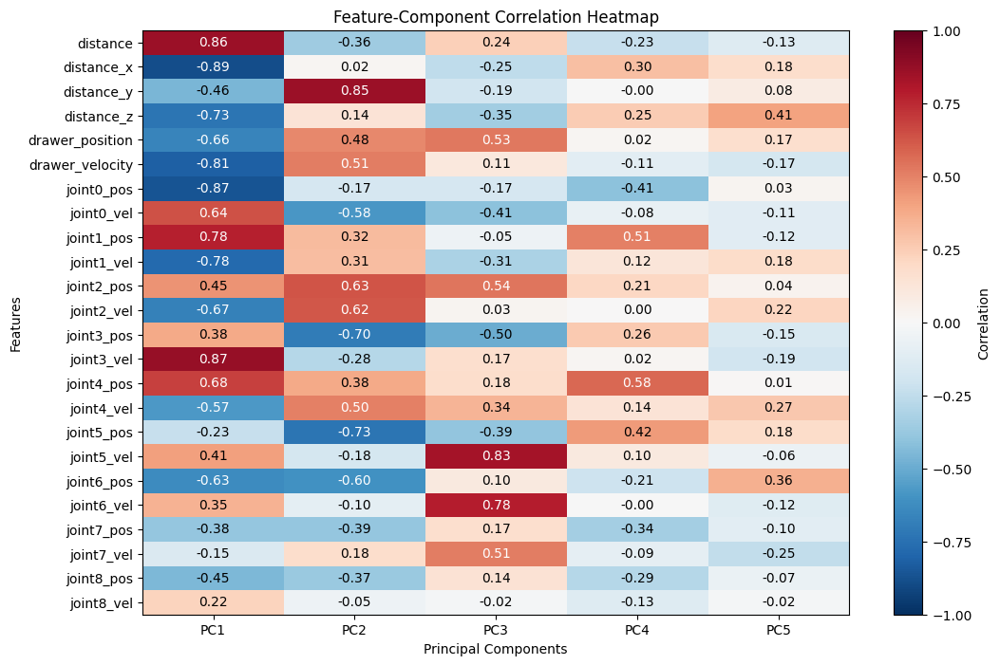

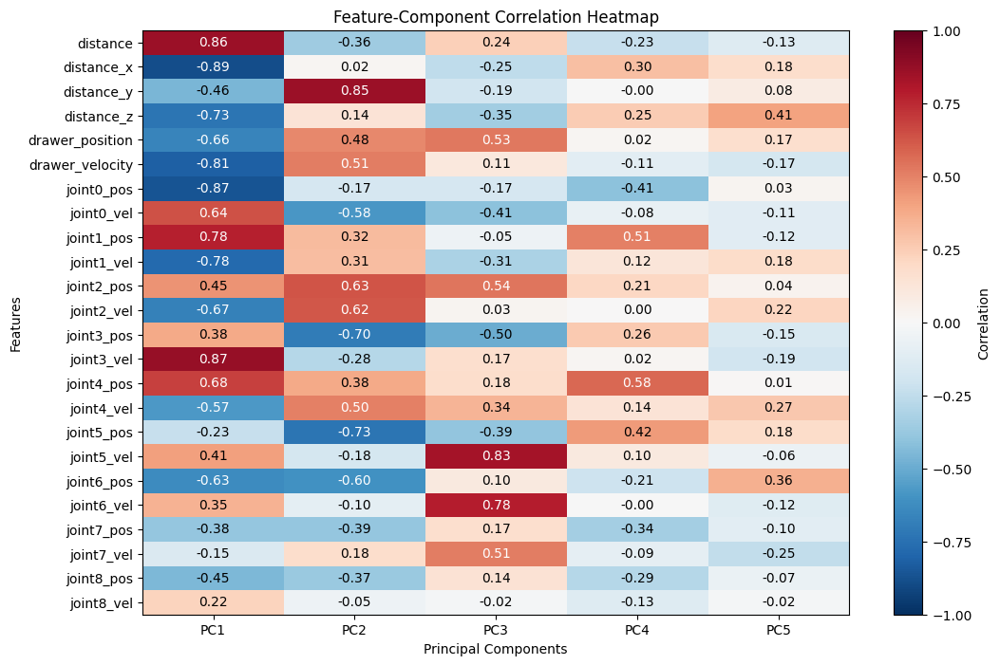

In [20]:
feature_correlations = pca_analyzer.compute_feature_component_correlations(
    dataset,
    projected_activations,
    features
)

visualizer.plot_feature_component_correlation_heatmap(feature_correlations, features)

- PC1 focuses on distance, drawer attributes and early-mid joints overall
- PC2 focuses very strongly on distance_y, moderately on drawer attributes, moderately on joint 2,  strongly on joint 3 and 5 pos, and moderately for the remainder of the joint pos

- PC3 focuses moderately on drawer position, joint 2 and 3 pos, and strongly for late joint vel
    - is this the locomotion component for the start of the opening phase?

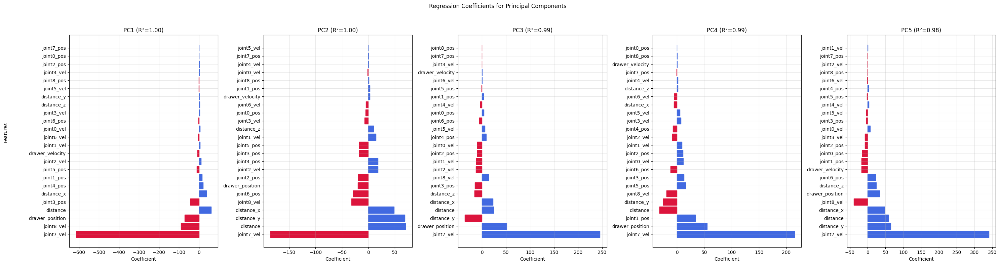

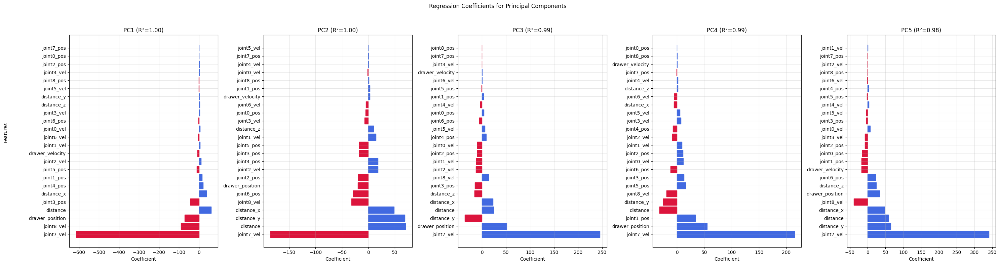

In [21]:
regression_results = pca_analyzer.regress_features_against_components(
    dataset, 
    projected_activations,
    features
)

visualizer.plot_regression_coefficients(regression_results, features)

linear regression so don't take the coefficients too seriously

## Analysis by layer

In [9]:
layer_name = 'actor_mlp_1'

### Early layer

In [35]:
pca_results = pca_analyzer.run_pca(dataset, layer_name, n_components)

In [36]:
print(f"Explained variance ratio: {pca_results['explained_variance_ratio']}")
print(f"Total explained variance: {pca_results['explained_variance_ratio'].sum():.2f}")

Explained variance ratio: [0.48568133 0.18016696 0.15521464 0.05912156 0.03280795]
Total explained variance: 0.91


In [37]:
projected_activations = pca_analyzer.project_activations(dataset, pca_results['pca_model'], layer_name)

In [38]:
regression_results = pca_analyzer.regress_features_against_components(
    dataset, 
    projected_activations,
    features
)

In [39]:
feature_correlations = pca_analyzer.compute_feature_component_correlations(
    dataset,
    projected_activations,
    features
)

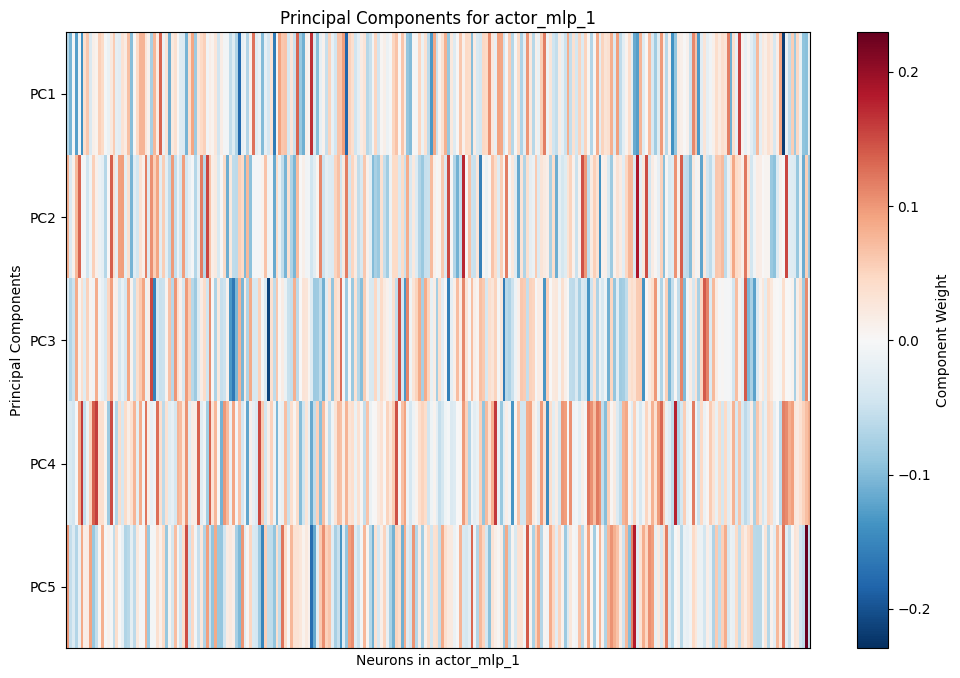

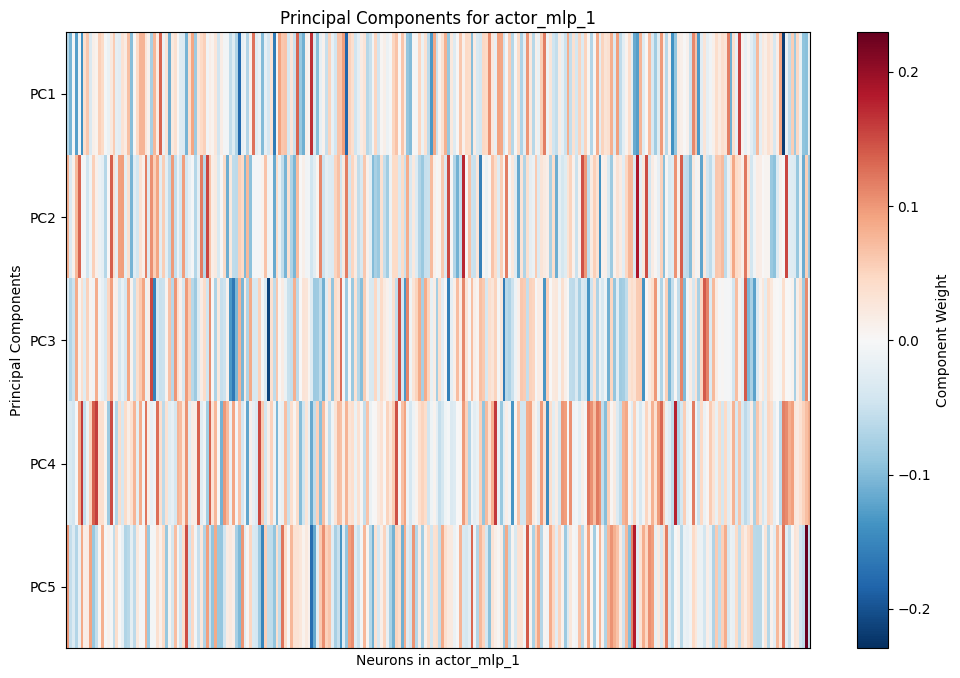

In [40]:
visualizer.plot_pca_components(pca_results['components'], layer_name)

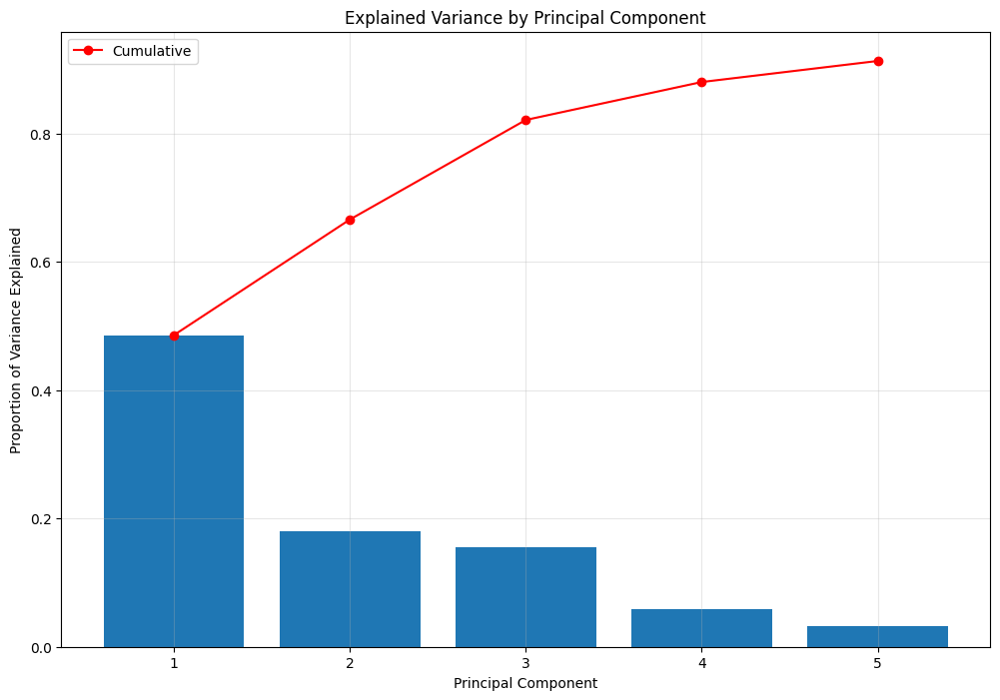

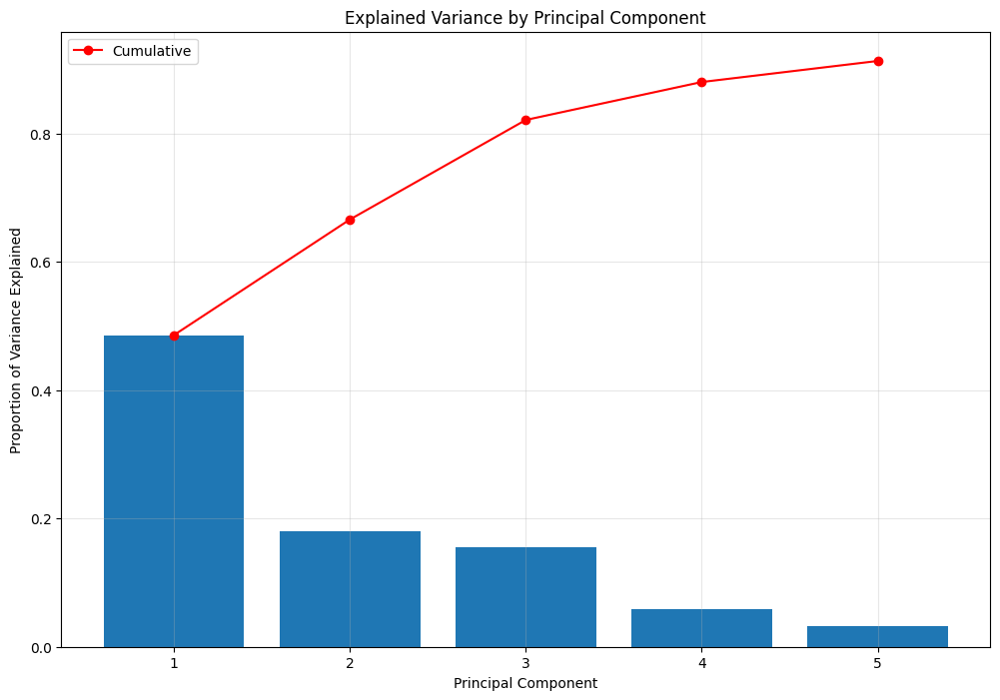

In [41]:
visualizer.plot_explained_variance(pca_results['explained_variance_ratio'])

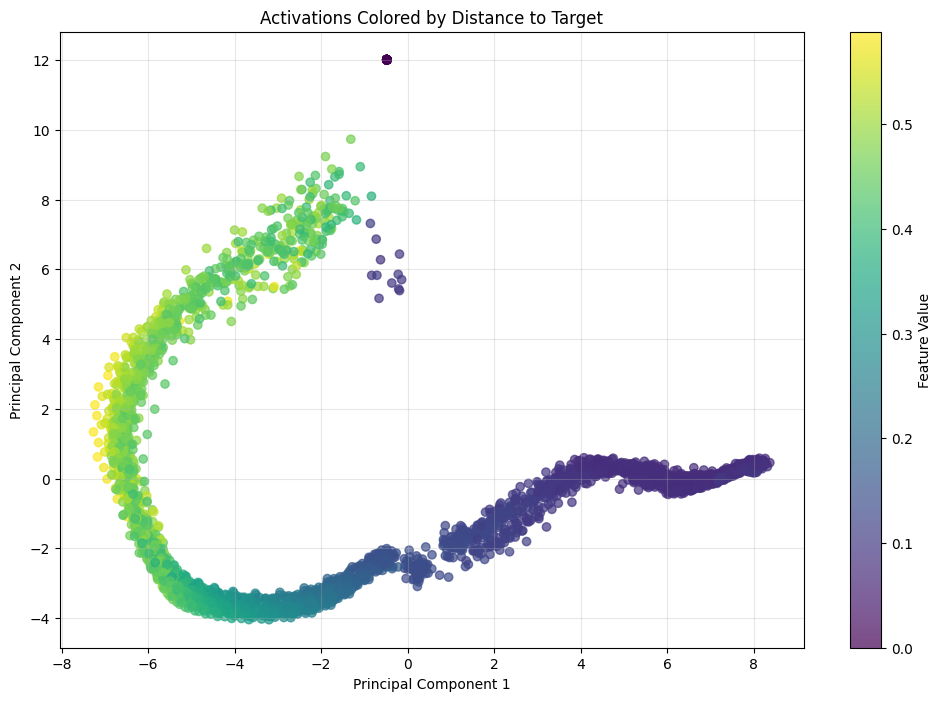

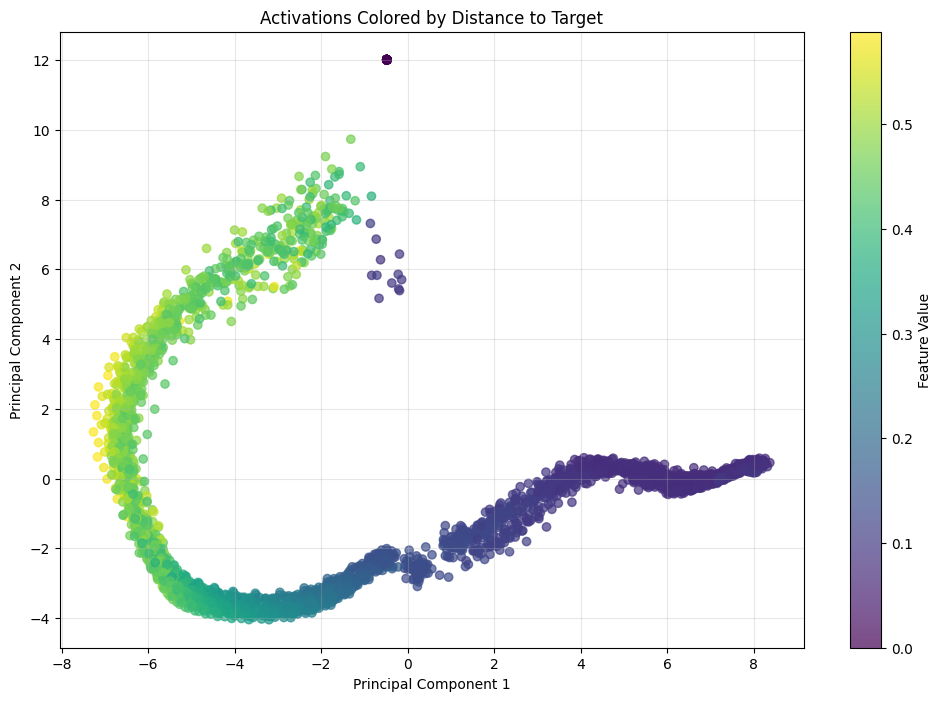

In [43]:
visualizer.plot_projected_activations_by_feature(
    projected_activations, 
    dataset.get_flattened_feature('distance'),
    title="Activations Colored by Distance to Target"
)

both PCs are sensitive to distance to target

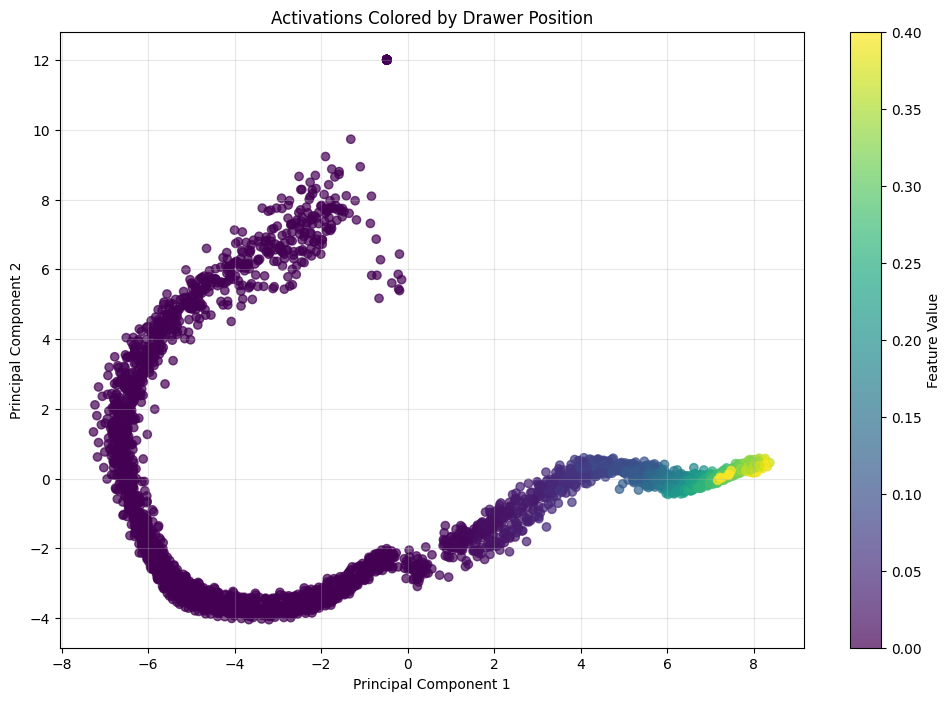

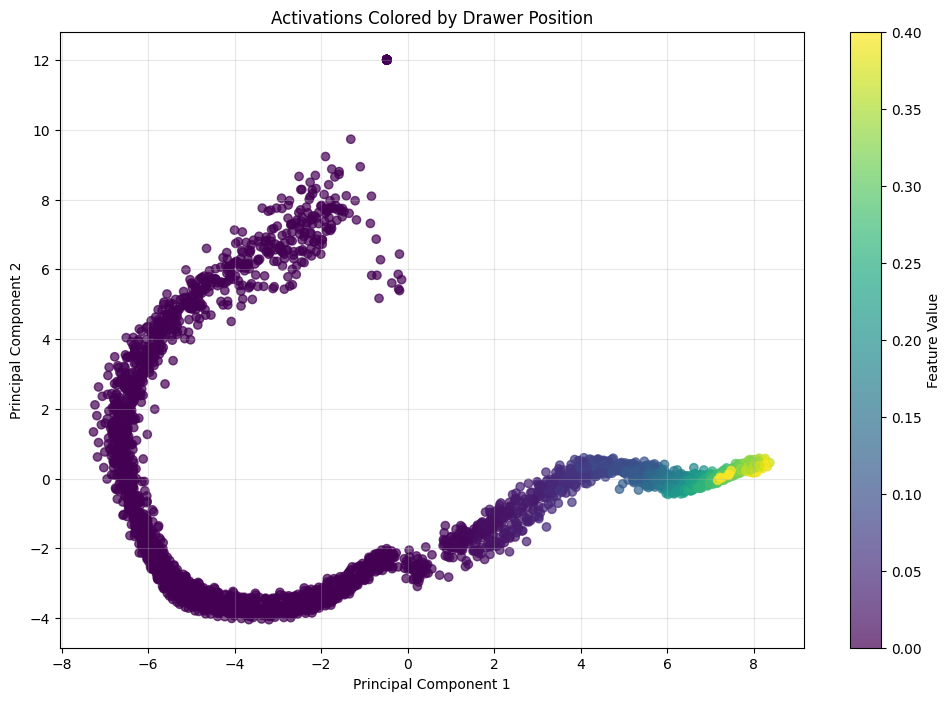

In [54]:
visualizer.plot_projected_activations_by_feature(
    projected_activations, 
    feature_values=dataset.get_flattened_feature('drawer_position'),
    title="Activations Colored by Drawer Position"
)

PC1 attends a bit to drawer position, but PC2 does not

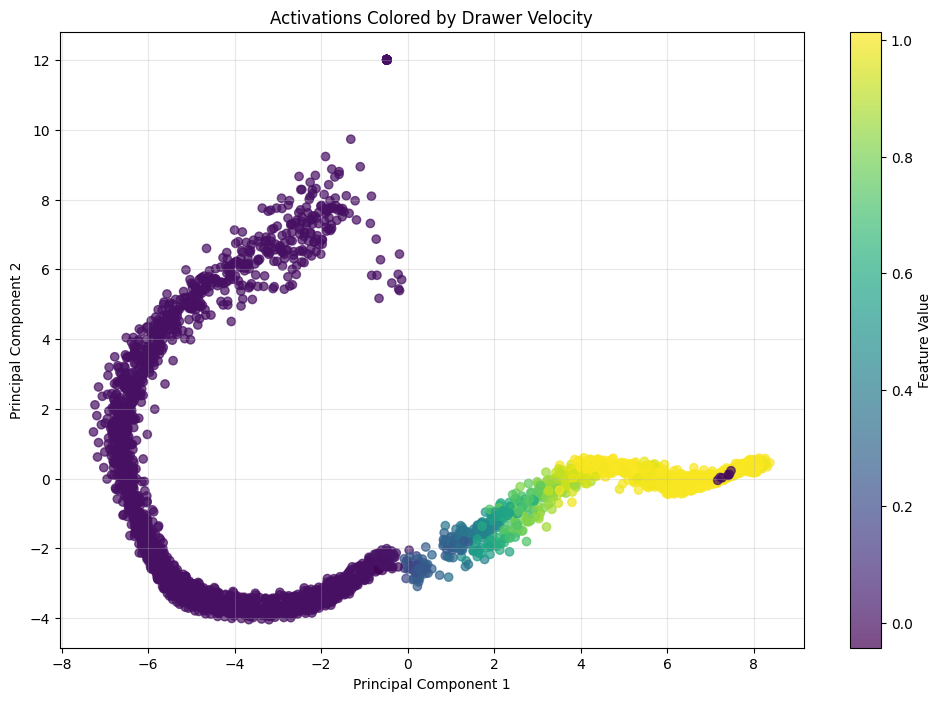

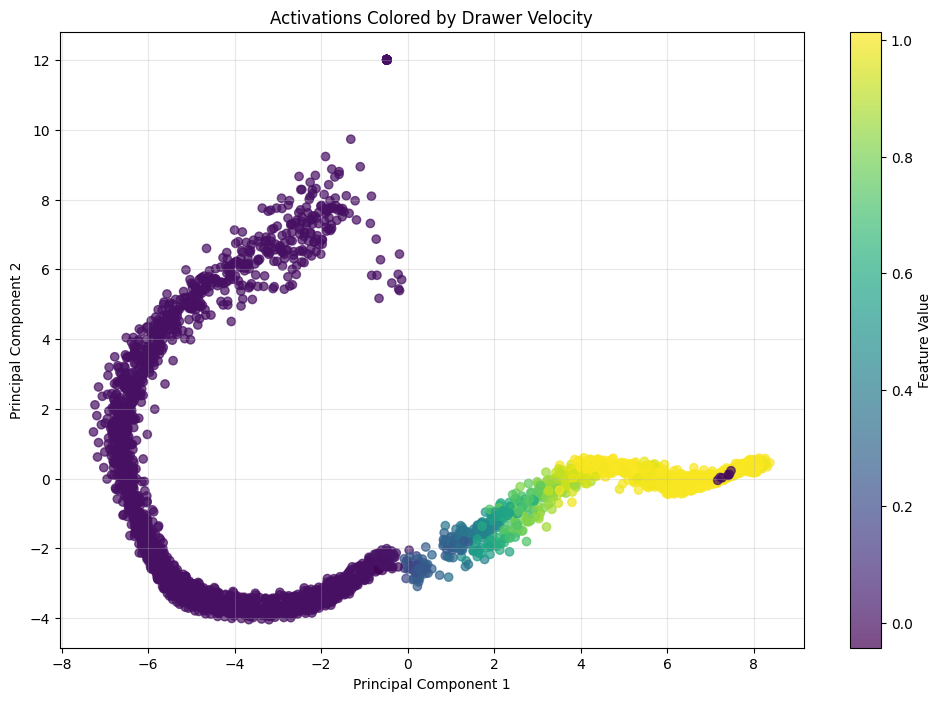

In [57]:
visualizer.plot_projected_activations_by_feature(
    projected_activations, 
    feature_values=dataset.get_flattened_feature('drawer_velocity'),
    title="Activations Colored by Drawer Velocity"
)

PC1 attends to drawer velocity, but PC2 does not

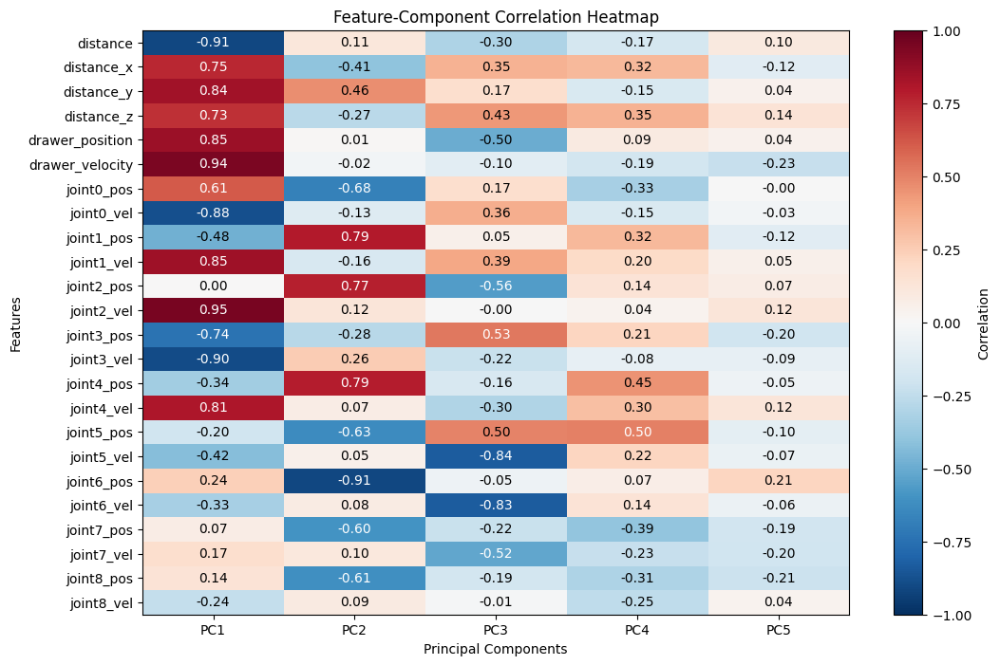

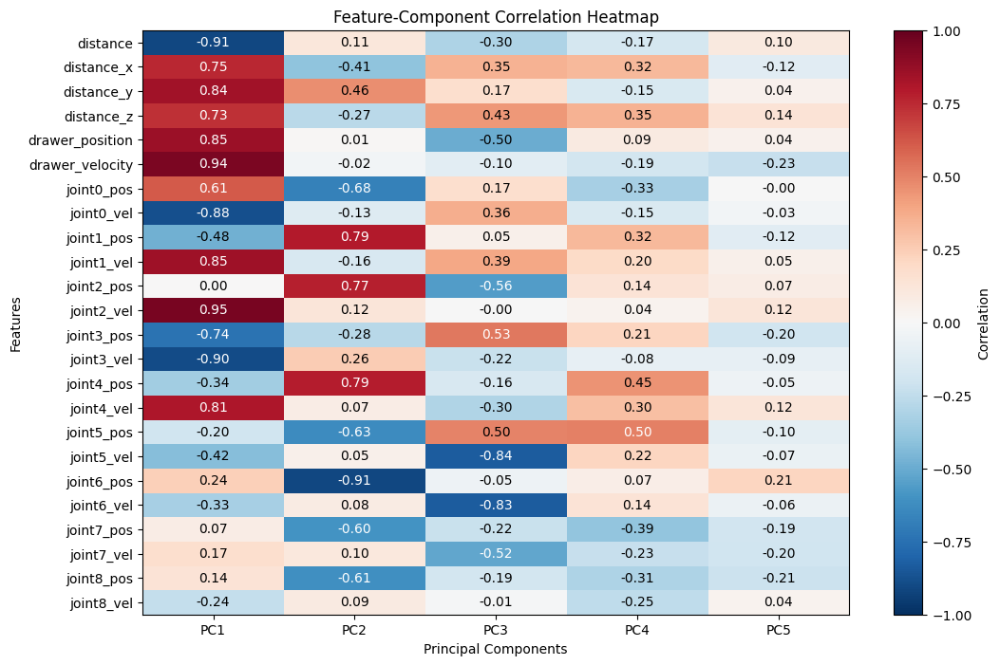

In [44]:
visualizer.plot_feature_component_correlation_heatmap(feature_correlations, features)

- PC1 seems to be sensitive to distances, drawer position, drawer velocity, and early joint velocities
    - suggests it is focused on high level planning of the entire process?
- PC2 seems to be mildly sensitive to distances, non-correlated with drawer position and velocity, highly sensitive to all joint positions
    - suggests it is focused on perception in the approach phase?
- PC3 seems to be mildly sensitive to distances and drawer position, early joint velocities, mid joint positions, late joint velocities
    - suggests it is a superposition of approaching and sustained opening?
- PC4 seems to be mildly sensitive to distances and mid-late joints and velocities
    - suggests it is focused on fine-grained control when it is near the target?

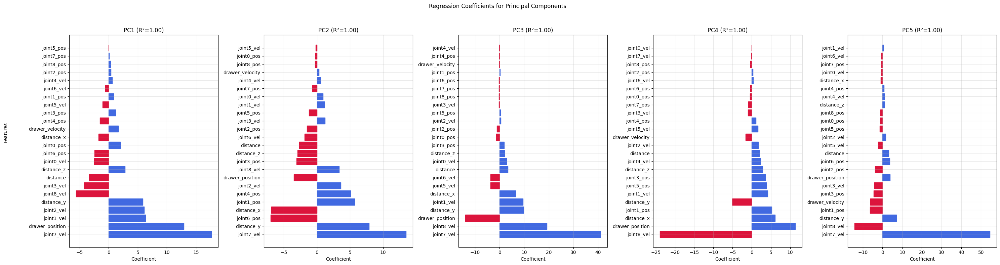

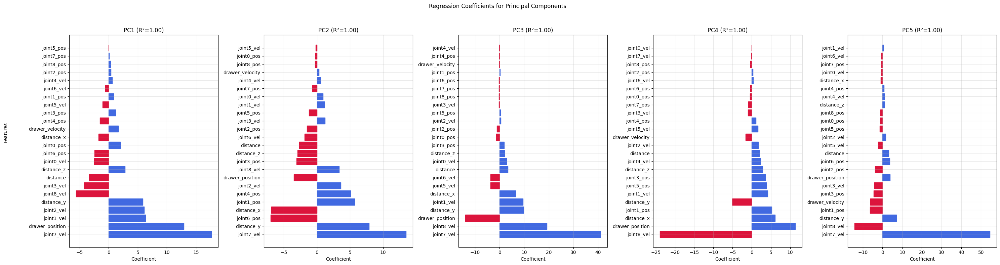

In [46]:
visualizer.plot_regression_coefficients(regression_results, features)

linear regression so don't take the coefficients too seriously

### Mid layer

In [47]:
layer_name = 'actor_mlp_3'

In [48]:
pca_results_mid = pca_analyzer.run_pca(dataset, layer_name, n_components)
print(f"Explained variance ratio: {pca_results_mid['explained_variance_ratio']}")
print(f"Total explained variance: {pca_results_mid['explained_variance_ratio'].sum():.2f}")

Explained variance ratio: [0.43989548 0.24872372 0.11114422 0.06379599 0.03852305]
Total explained variance: 0.90


In [49]:
projected_activations_mid = pca_analyzer.project_activations(dataset, pca_results_mid['pca_model'], layer_name)

feature_correlations_mid = pca_analyzer.compute_feature_component_correlations(
    dataset,
    projected_activations_mid,
    features
)

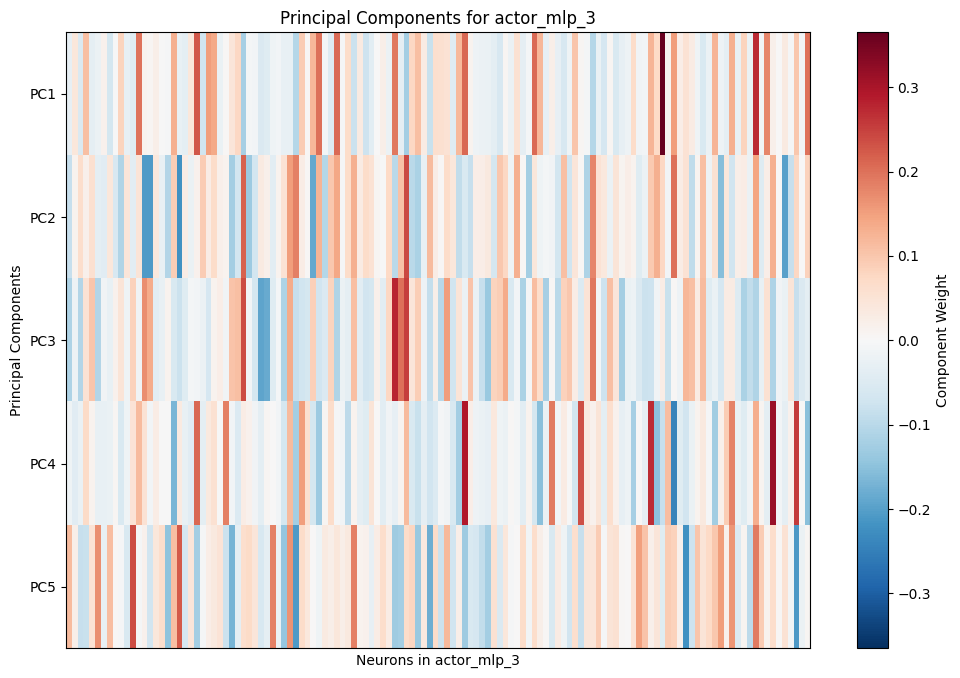

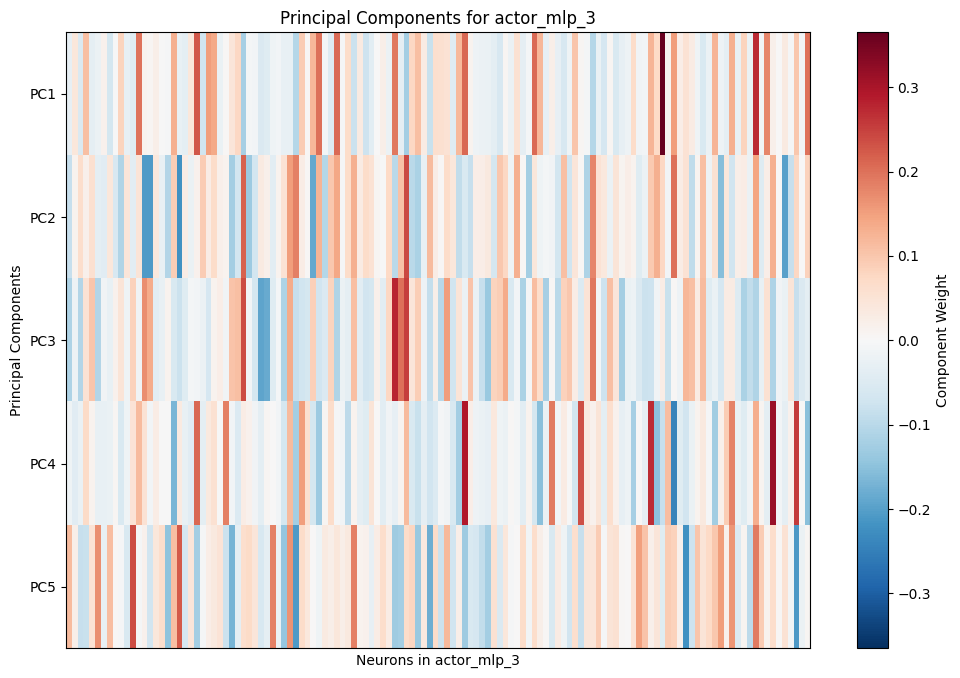

In [50]:
visualizer.plot_pca_components(pca_results_mid['components'], layer_name)

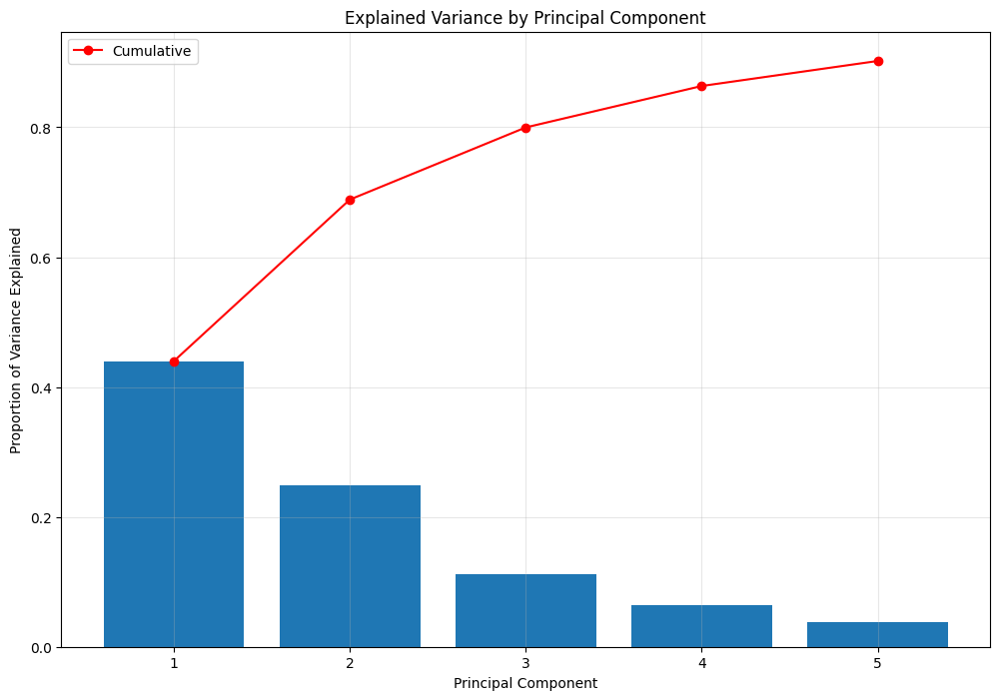

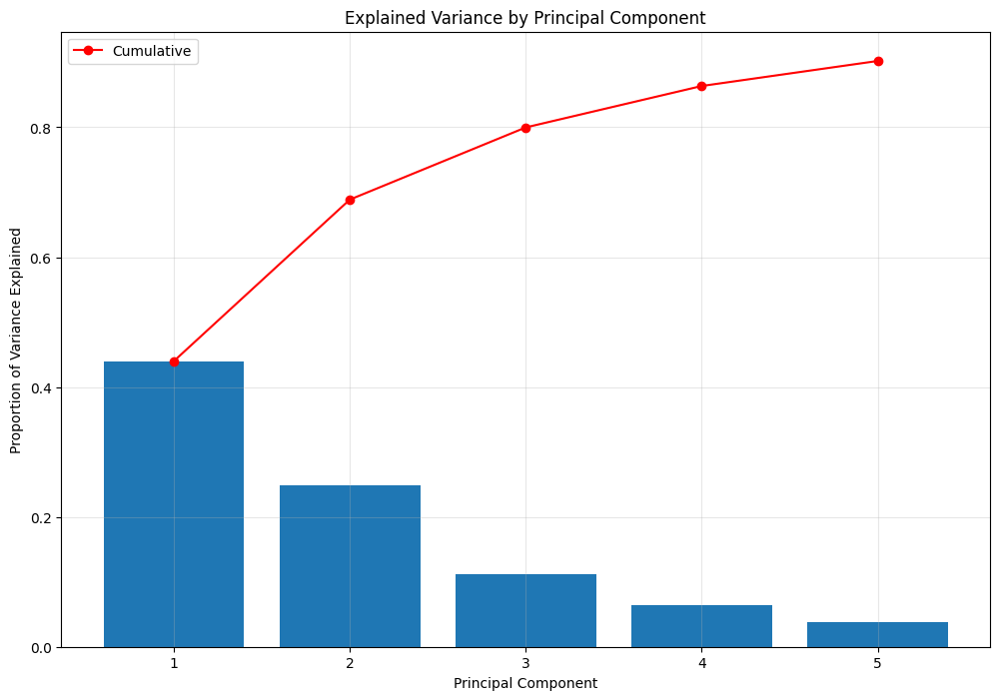

In [51]:
visualizer.plot_explained_variance(pca_results_mid['explained_variance_ratio'])

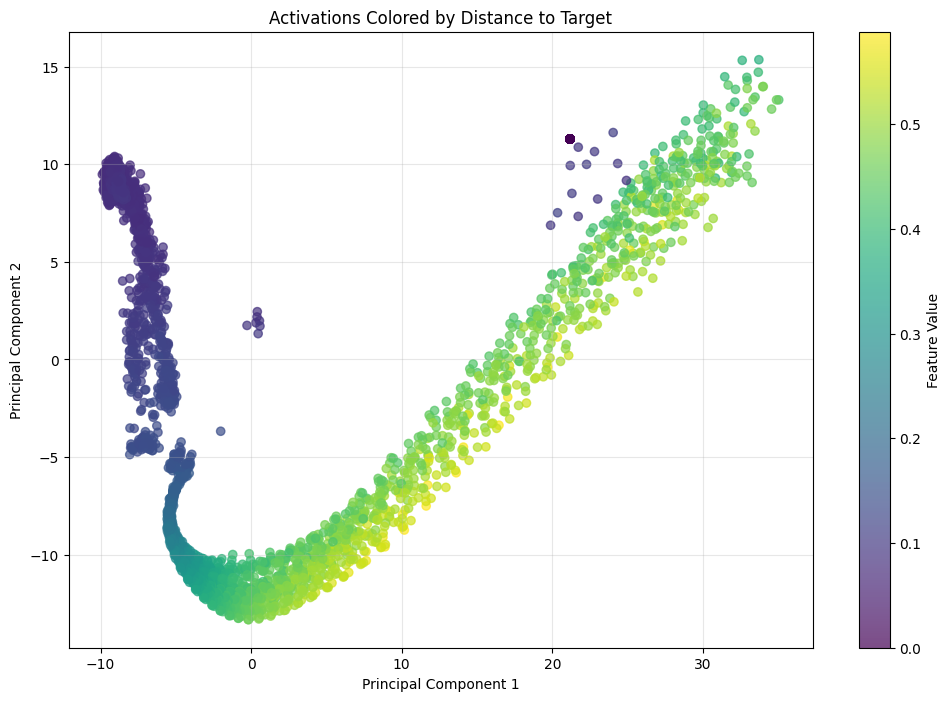

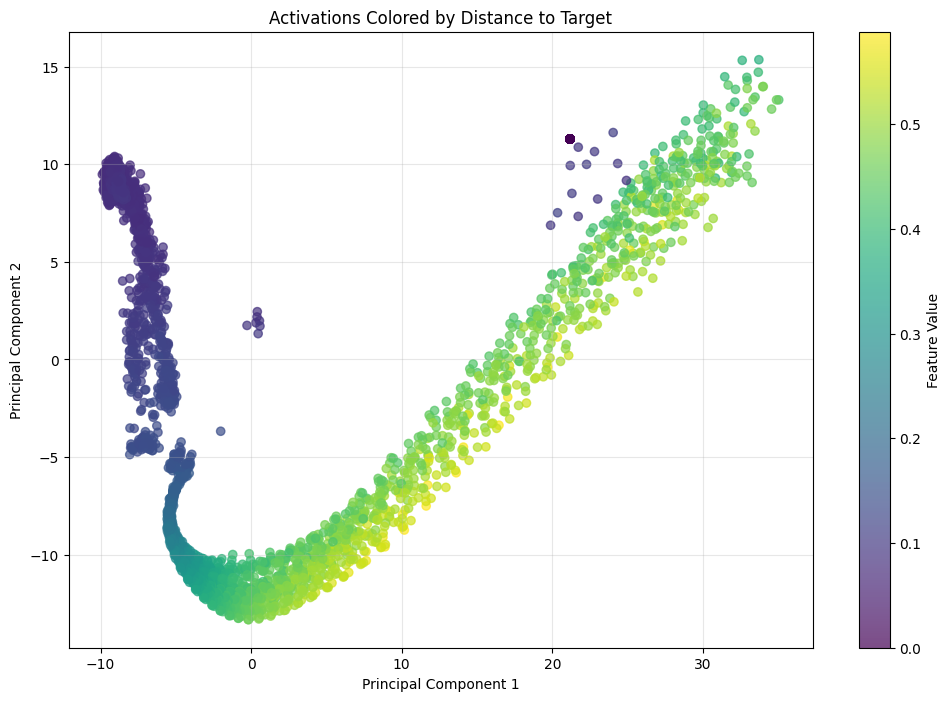

In [52]:
visualizer.plot_projected_activations_by_feature(
    projected_activations_mid, 
    dataset.get_flattened_feature('distance'),
    title="Activations Colored by Distance to Target"
)

notice 2 clusters, 1 with no relation with distance, the other with mixed relations

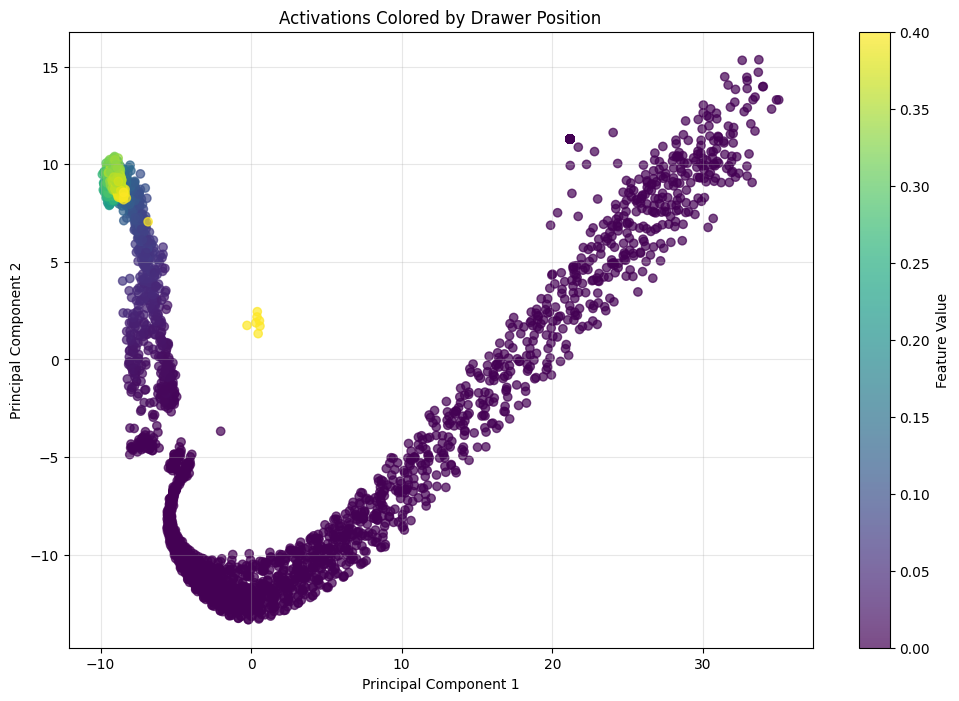

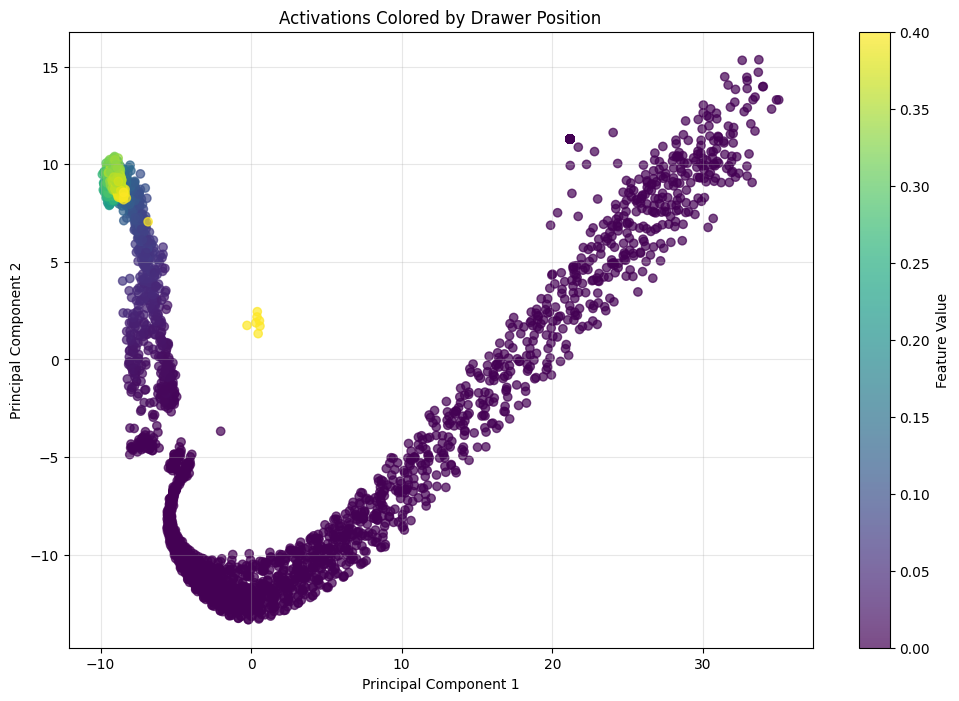

In [58]:
visualizer.plot_projected_activations_by_feature(
    projected_activations_mid, 
    dataset.get_flattened_feature('drawer_position'),
    title="Activations Colored by Drawer Position"
)

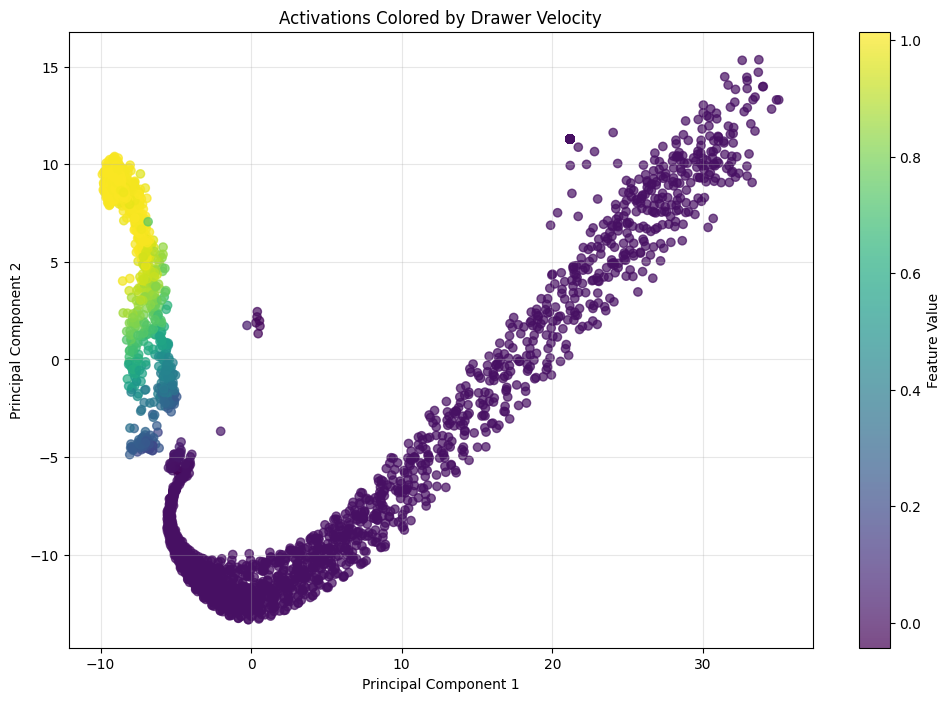

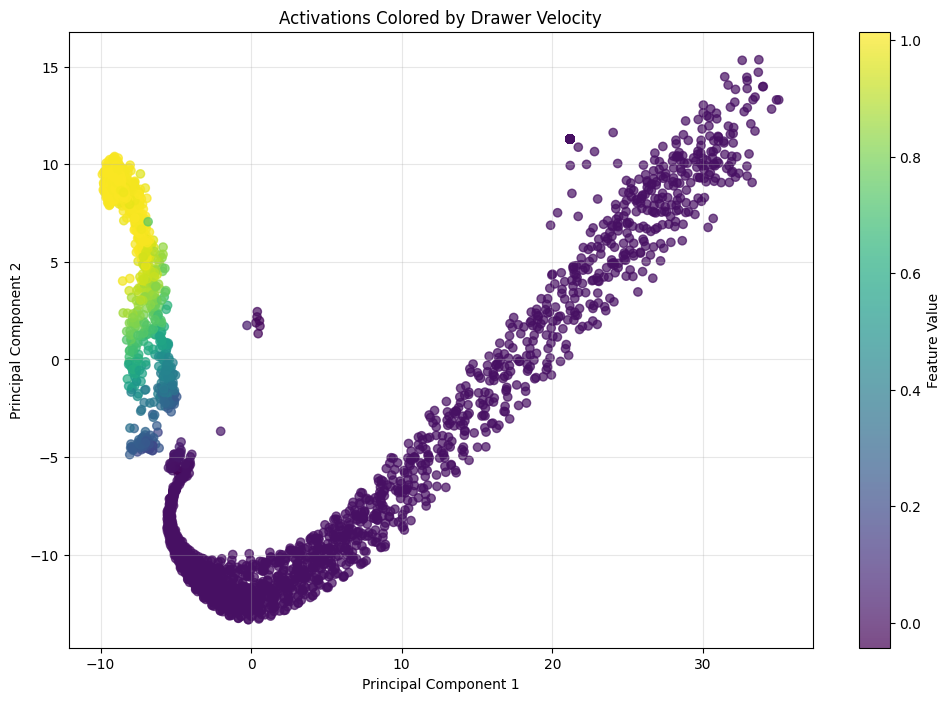

In [59]:
visualizer.plot_projected_activations_by_feature(
    projected_activations_mid, 
    dataset.get_flattened_feature('drawer_velocity'),
    title="Activations Colored by Drawer Velocity"
)

PC2 attends to drawer velocity

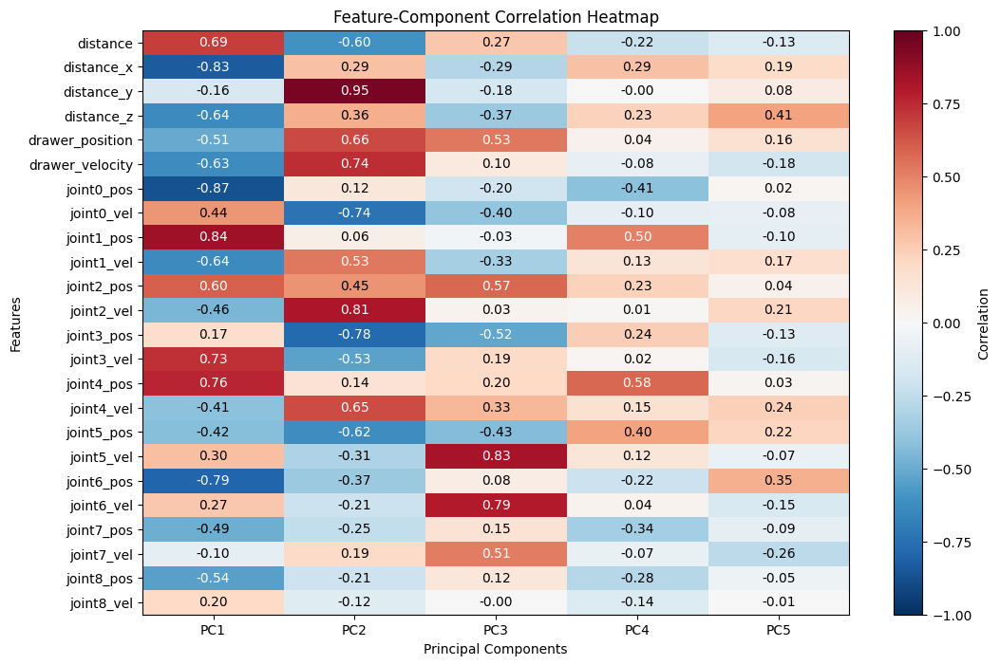

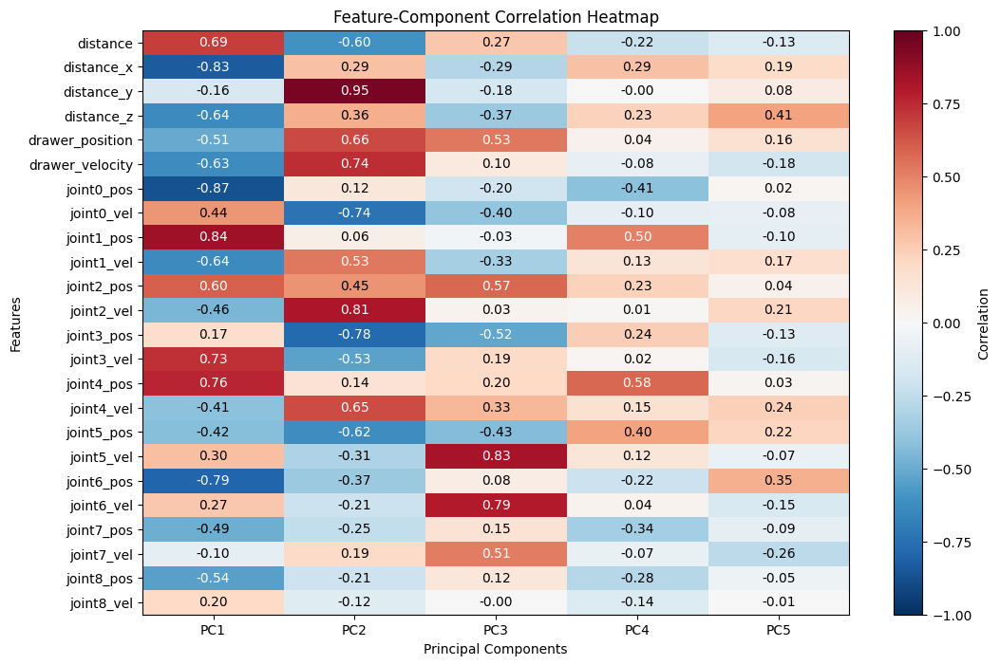

In [60]:
visualizer.plot_feature_component_correlation_heatmap(feature_correlations_mid, features)

for the middle layer,

- PC1 attends to distances, drawer position and velocity, early-mid joint positions and velocities, late joint positions
    - is this another high level planning component for all phases?
- PC2 attends to distances, drawer position and velocities, early-mid joint position and velocities that also complements PC1
    - might be a the perception and locomotion component during the opening phase
- PC3 lightly attends to distances, some on drawer position, small for drawer velocity, slight attention to early joint velocities, heavy attention to mid-late joint velocities
    - might be the finer grained control during the start of the opening phase?

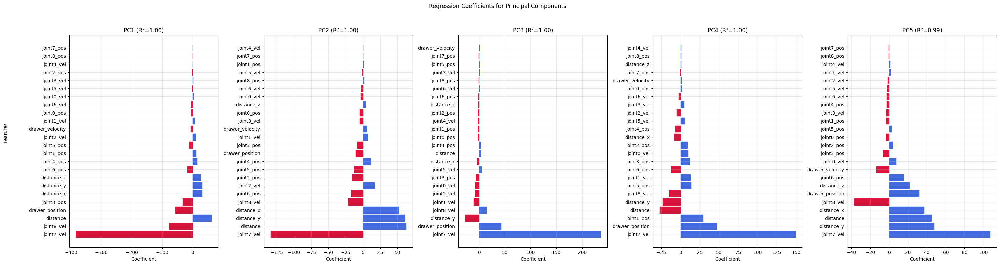

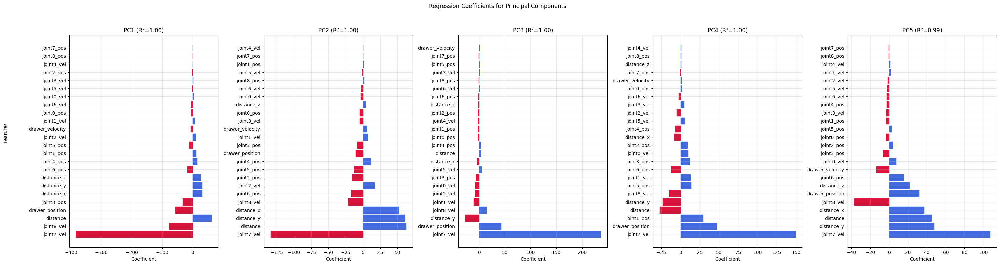

In [61]:
regression_results_mid = pca_analyzer.regress_features_against_components(
    dataset, 
    projected_activations_mid,
    features
)
visualizer.plot_regression_coefficients(regression_results_mid, features)

### Late layer

In [62]:
layer_name = 'actor_mlp_5'

In [63]:
pca_results_late = pca_analyzer.run_pca(dataset, layer_name, n_components)
print(f"Explained variance ratio: {pca_results_late['explained_variance_ratio']}")
print(f"Total explained variance: {pca_results_late['explained_variance_ratio'].sum():.2f}")

Explained variance ratio: [0.502553   0.15718853 0.11640401 0.05586936 0.05042096]
Total explained variance: 0.88


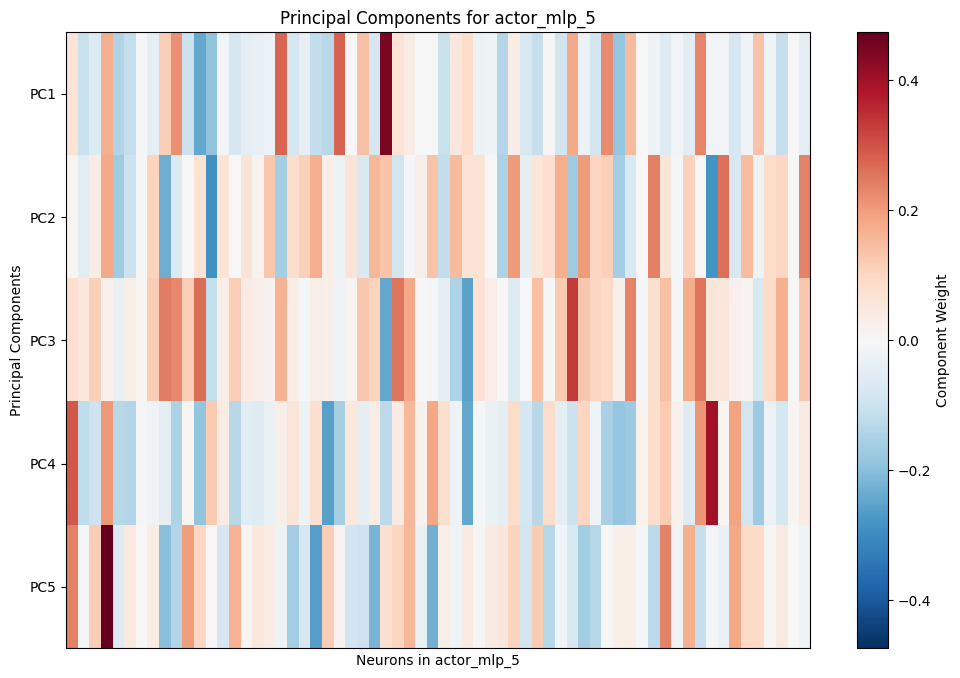

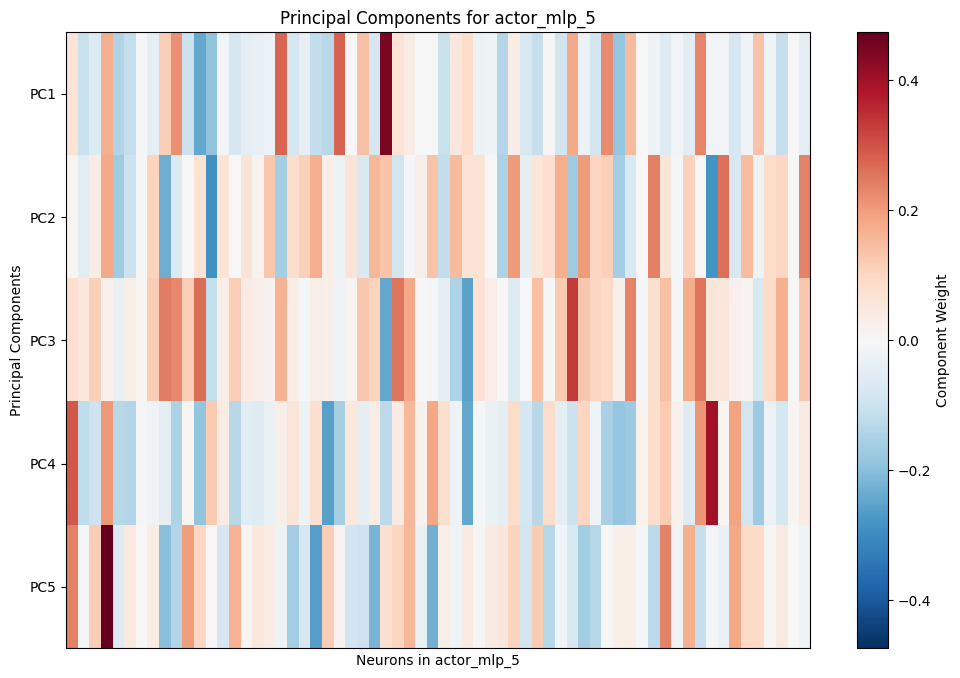

In [65]:
visualizer.plot_pca_components(pca_results_late['components'], layer_name)

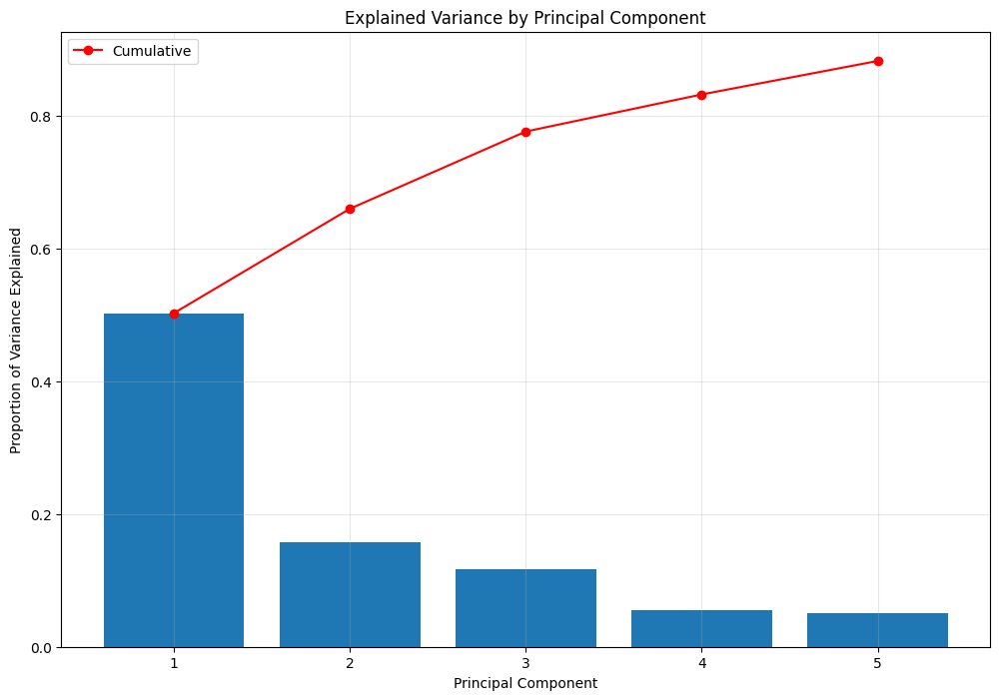

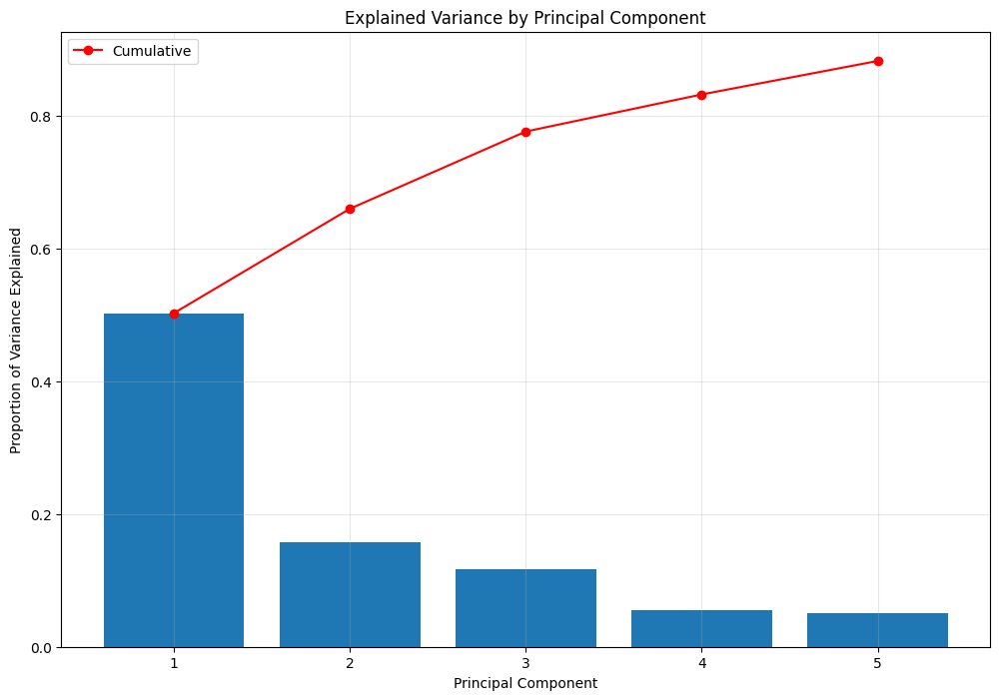

In [66]:
visualizer.plot_explained_variance(pca_results_late['explained_variance_ratio'])

In [67]:
projected_activations_late = pca_analyzer.project_activations(dataset, pca_results_late['pca_model'], layer_name)

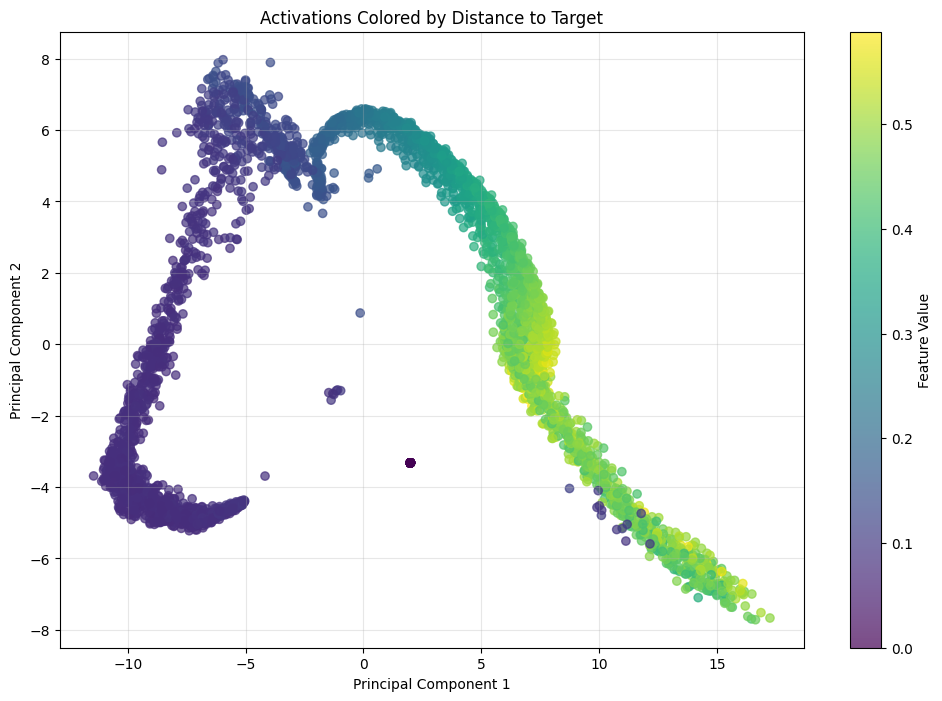

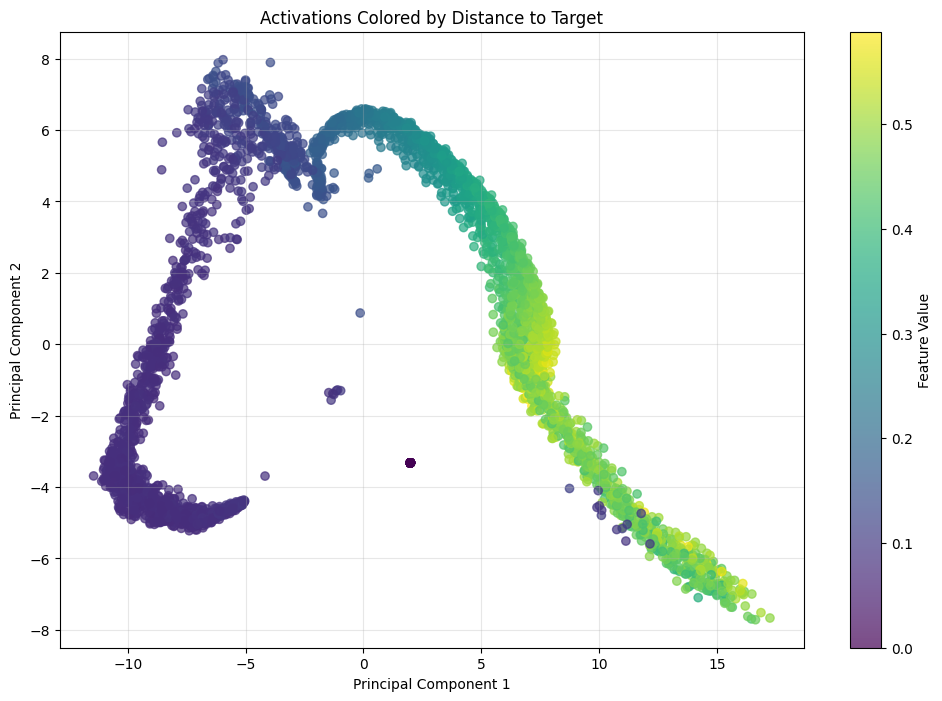

In [68]:
visualizer.plot_projected_activations_by_feature(
    projected_activations_late, 
    dataset.get_flattened_feature('distance'),
    title="Activations Colored by Distance to Target"
)

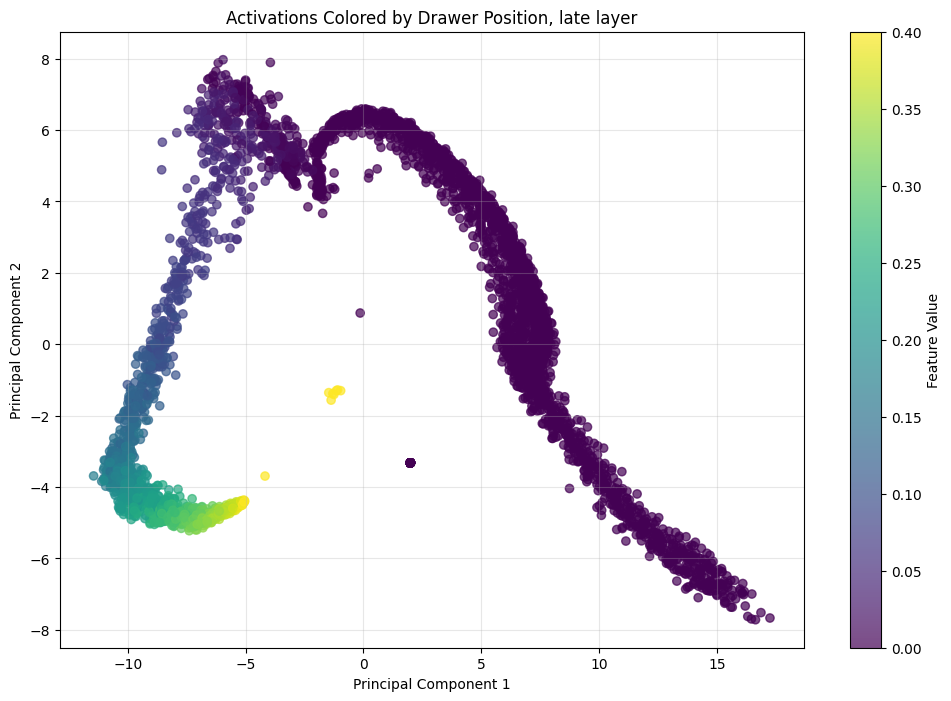

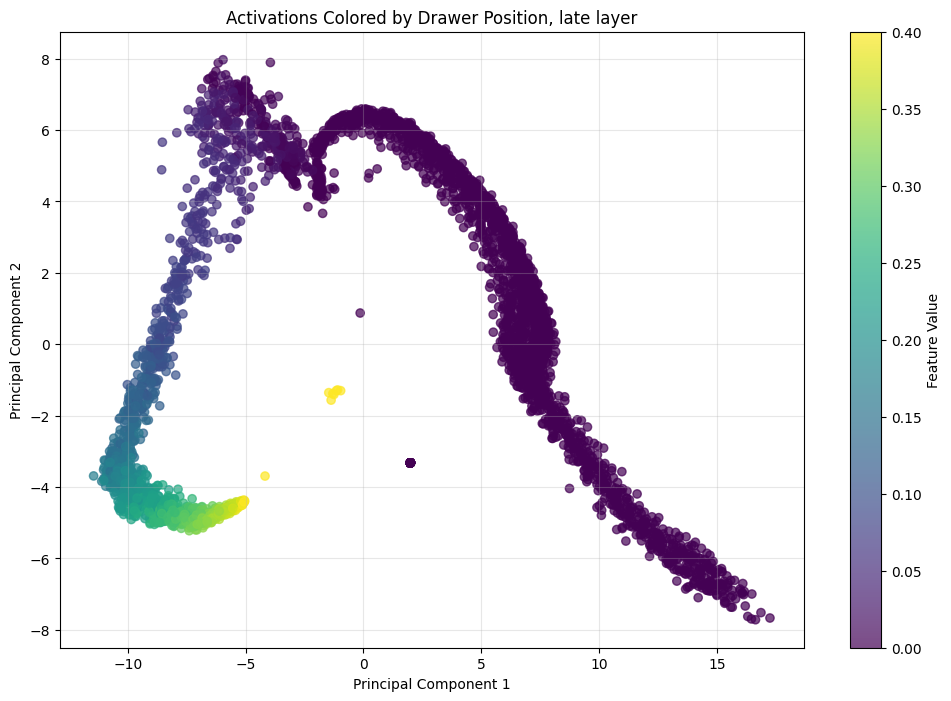

In [69]:
visualizer.plot_projected_activations_by_feature(
    projected_activations_late, 
    dataset.get_flattened_feature('drawer_position'),
    title="Activations Colored by Drawer Position, late layer"
)

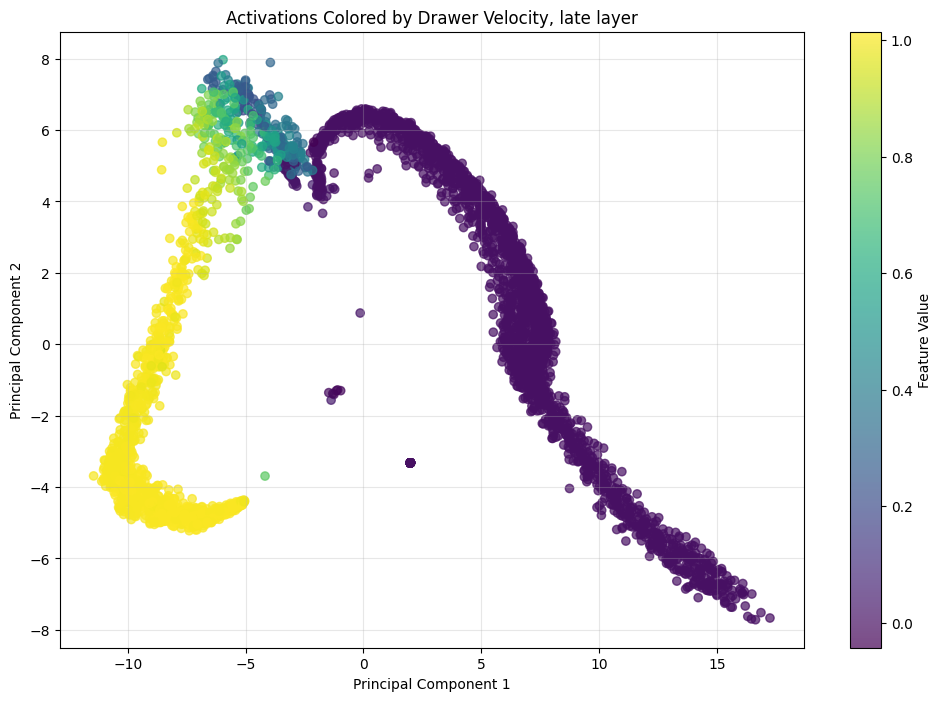

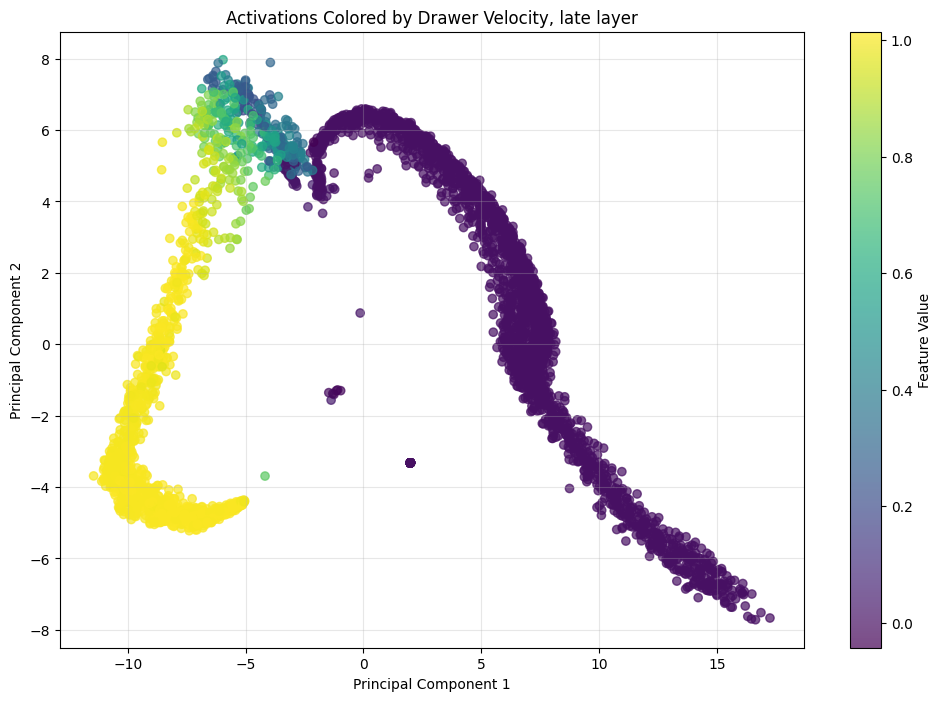

In [70]:
visualizer.plot_projected_activations_by_feature(
    projected_activations_late, 
    dataset.get_flattened_feature('drawer_velocity'),
    title="Activations Colored by Drawer Velocity, late layer"
)

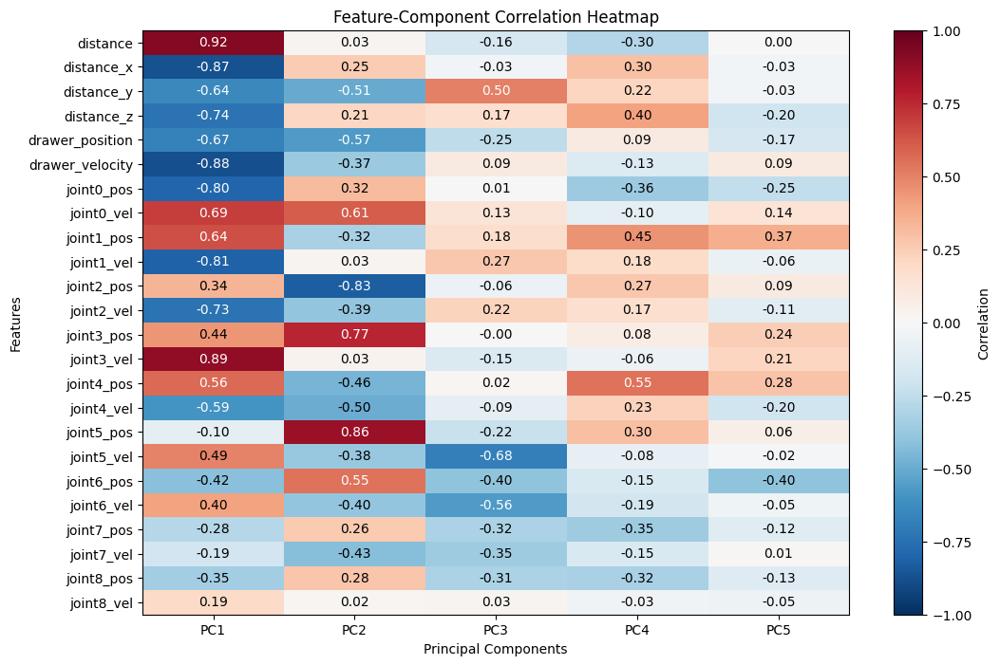

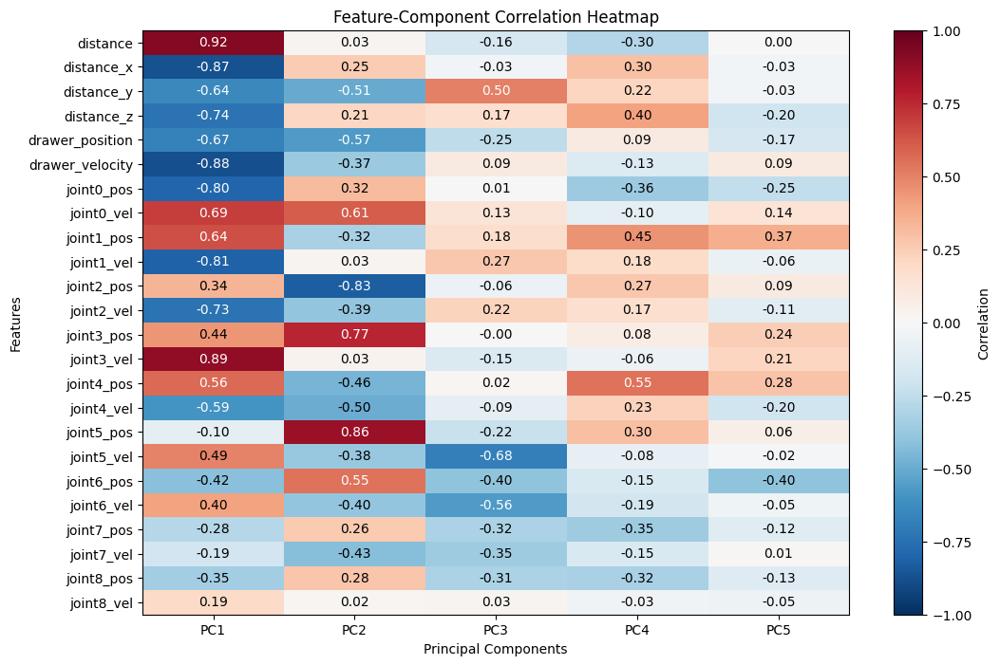

In [72]:
feature_correlations_late = pca_analyzer.compute_feature_component_correlations(
    dataset,
    projected_activations_late,
    features
)
visualizer.plot_feature_component_correlation_heatmap(feature_correlations_late, features)

- PC1 strongly attends to distances, drawer position and velocities, early joint position and velocities, mid joint velocities and lightly on mid joint positions
    - another high level planning component for the entire process?
- PC2 weakly attends to distances (emphasis on y distance), lightly on drawer position and velocities, moderate on early joint positions and velocities, strongly to mid joint positions and mildly on most joint velocities
    - might be perception for the opening phase
- PC3 has mild attention to y distance, drawer position, and strong attention on joint 5 and 6 velocities
    - might be the locomotion  during the opening phase
- PC4 attends mildly to distances, with a focus on joint 1 and 4 positions
    - remnants of the approaching phase?

### Other comments
- we can sort of see that for each layer, the 2D PC plots show distinct segments when varying by distance to target, drawer position, and drawer velocity

## Analysis on approaching phase

In [73]:
filtered_dataset = dataset.filter_by_phase('approaching')

In [74]:
for k, v in filtered_dataset.metadata['features'].items():
    print(k, v.shape)

distance_vec (1914, 3)
distance (1914,)
distance_x (1914,)
distance_y (1914,)
distance_z (1914,)
joint_positions (1914, 9)
joint_velocities (1914, 9)
joint0_pos (1914,)
joint0_vel (1914,)
joint1_pos (1914,)
joint1_vel (1914,)
joint2_pos (1914,)
joint2_vel (1914,)
joint3_pos (1914,)
joint3_vel (1914,)
joint4_pos (1914,)
joint4_vel (1914,)
joint5_pos (1914,)
joint5_vel (1914,)
joint6_pos (1914,)
joint6_vel (1914,)
joint7_pos (1914,)
joint7_vel (1914,)
joint8_pos (1914,)
joint8_vel (1914,)
drawer_position (1914,)
drawer_velocity (1914,)


In [75]:
for k, v in filtered_dataset.activations.items():
    print(k, v.shape)

actor_mlp_0 (1914, 256)
actor_mlp_1 (1914, 256)
actor_mlp_2 (1914, 128)
actor_mlp_3 (1914, 128)
actor_mlp_4 (1914, 64)
actor_mlp_5 (1914, 64)
value (1914, 1)
mu (1914, 9)


In [92]:
pca_results = pca_analyzer.run_pca(filtered_dataset, 'actor_mlp_1', n_components)

In [93]:
print(f"Explained variance ratio: {pca_results['explained_variance_ratio']}")
print(f"Total explained variance: {pca_results['explained_variance_ratio'].sum():.2f}")

Explained variance ratio: [0.5304405  0.29424155 0.07336859 0.02767263 0.0209646 ]
Total explained variance: 0.95


In [94]:
projected_activations = pca_analyzer.project_activations(filtered_dataset, pca_results['pca_model'], 'actor_mlp_1')

In [79]:
# features = [
#     'distance',
#     'distance_x', 'distance_y', 'distance_z',
# ] + [f'joint{i}_vel' for i in range(9)]

In [95]:
regression_results = pca_analyzer.regress_features_against_components(
    filtered_dataset, 
    projected_activations,
    features
)

In [96]:
feature_correlations = pca_analyzer.compute_feature_component_correlations(
    filtered_dataset,
    projected_activations,
    features
)

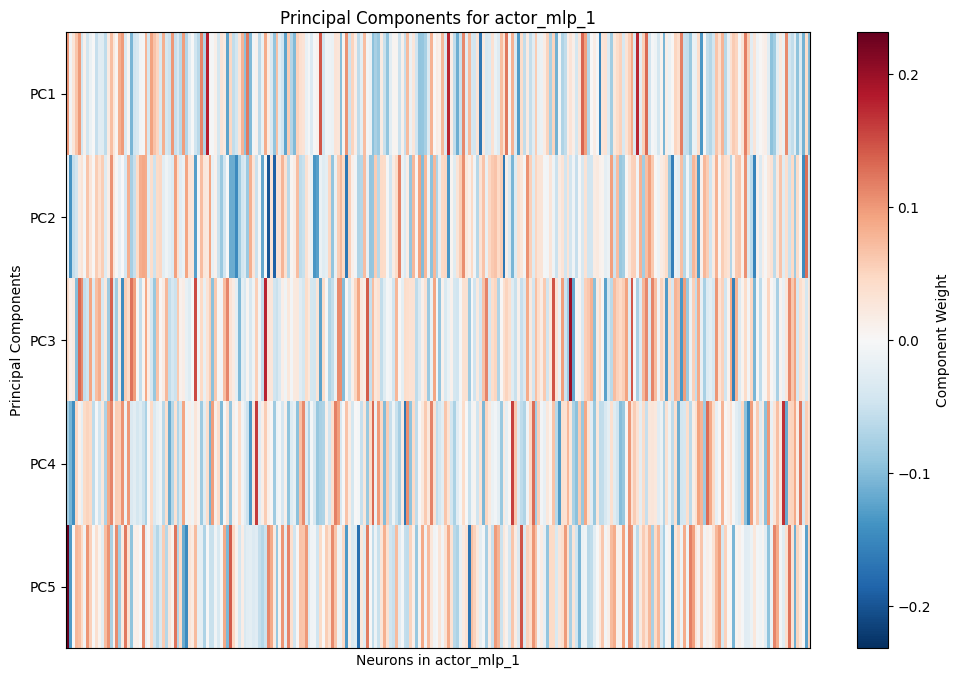

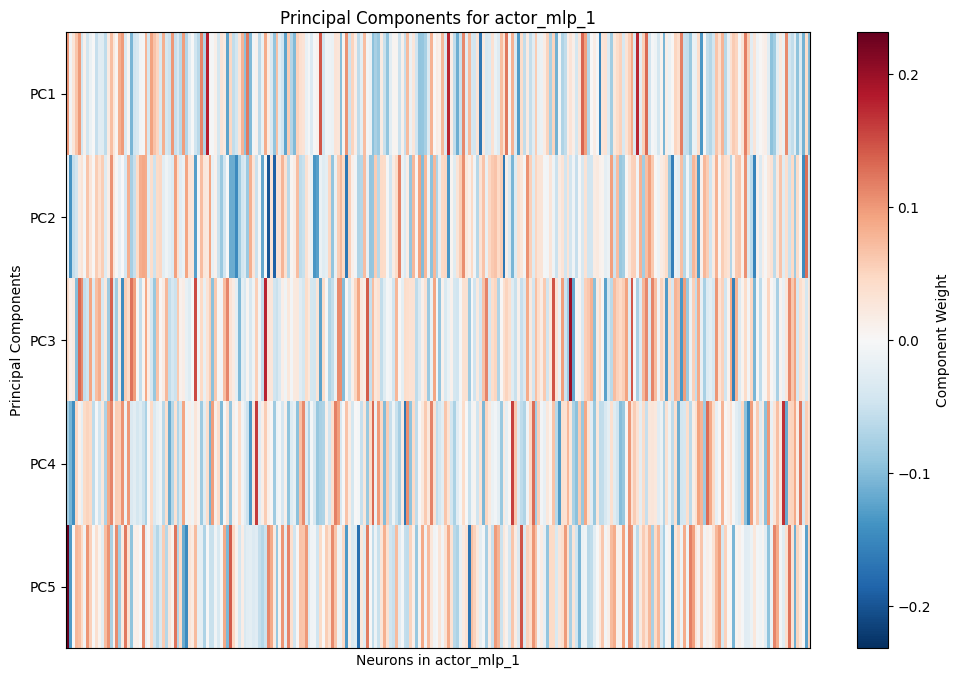

In [97]:
visualizer.plot_pca_components(pca_results['components'], 'actor_mlp_1')

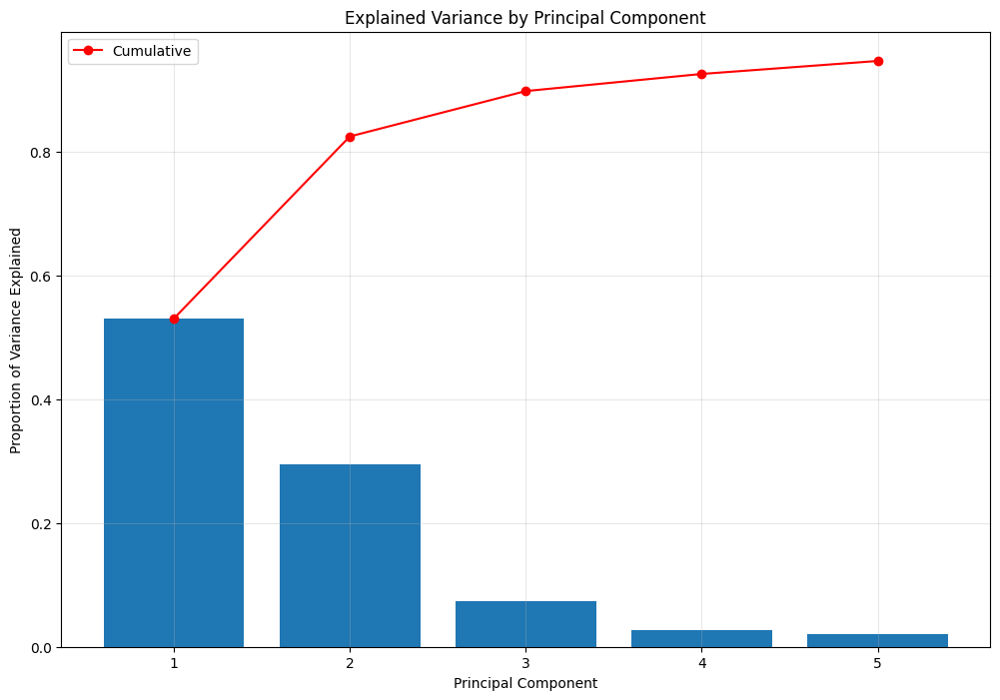

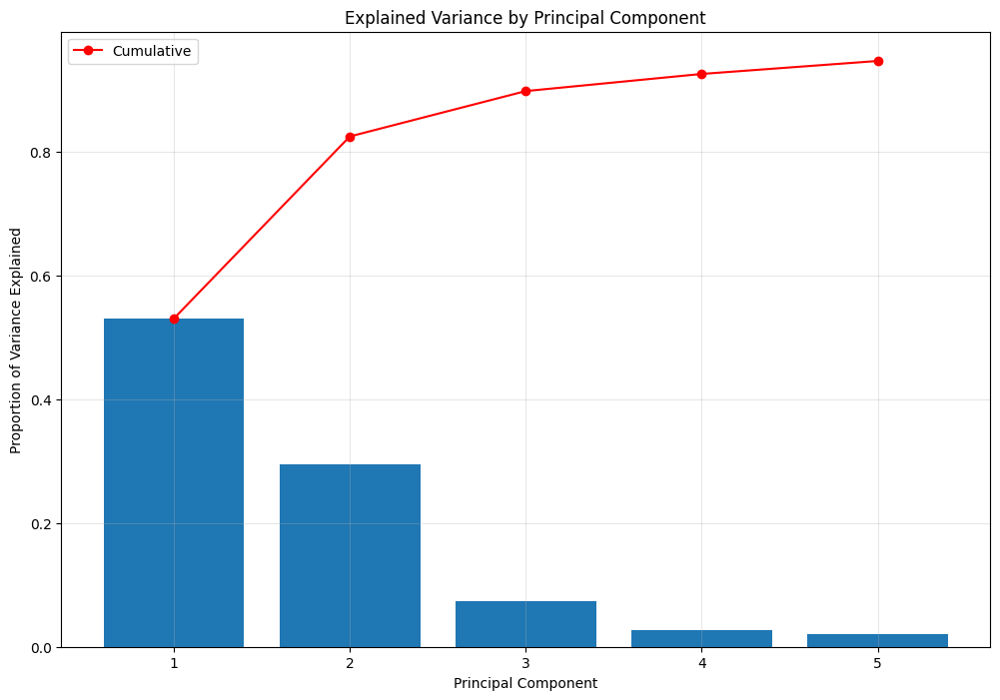

In [98]:
visualizer.plot_explained_variance(pca_results['explained_variance_ratio'])

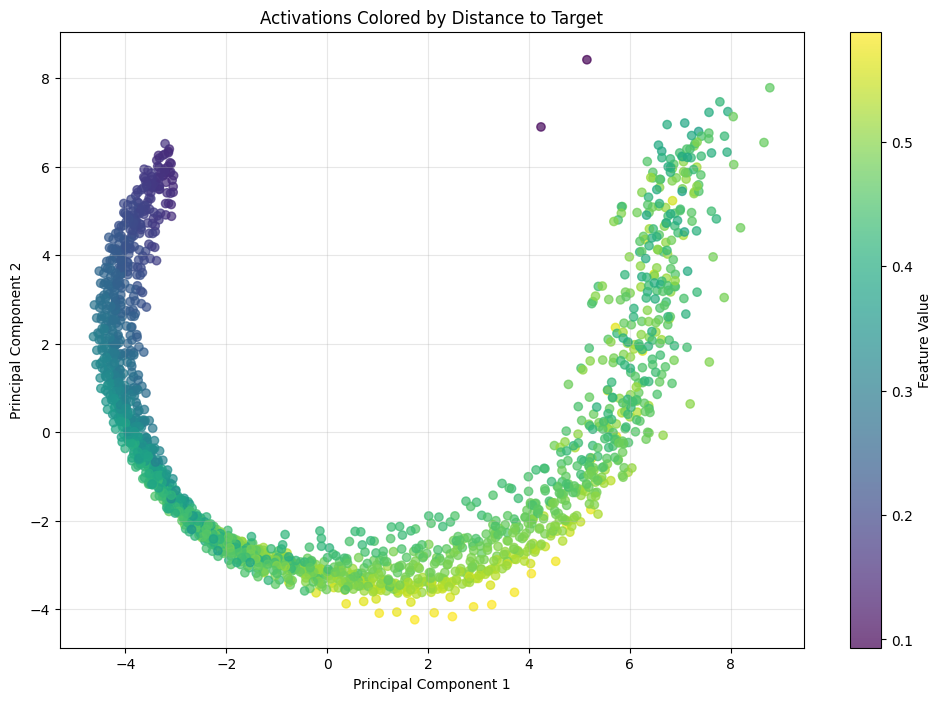

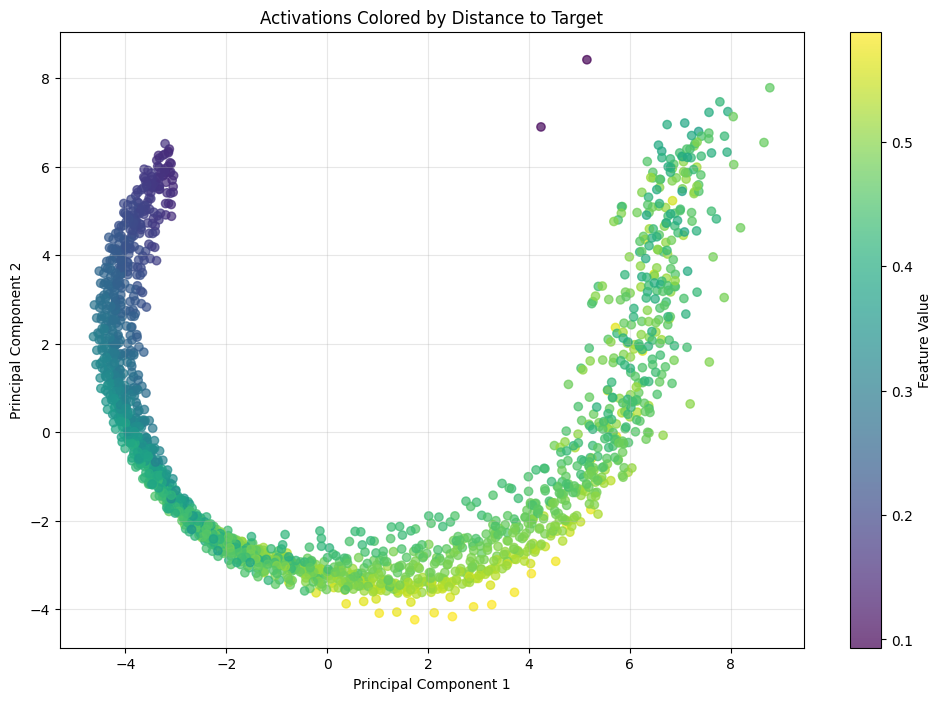

In [99]:
# Visualize projected activations colored by distance
visualizer.plot_projected_activations_by_feature(
    projected_activations, 
    filtered_dataset.get_flattened_feature('distance'),
    title="Activations Colored by Distance to Target"
)

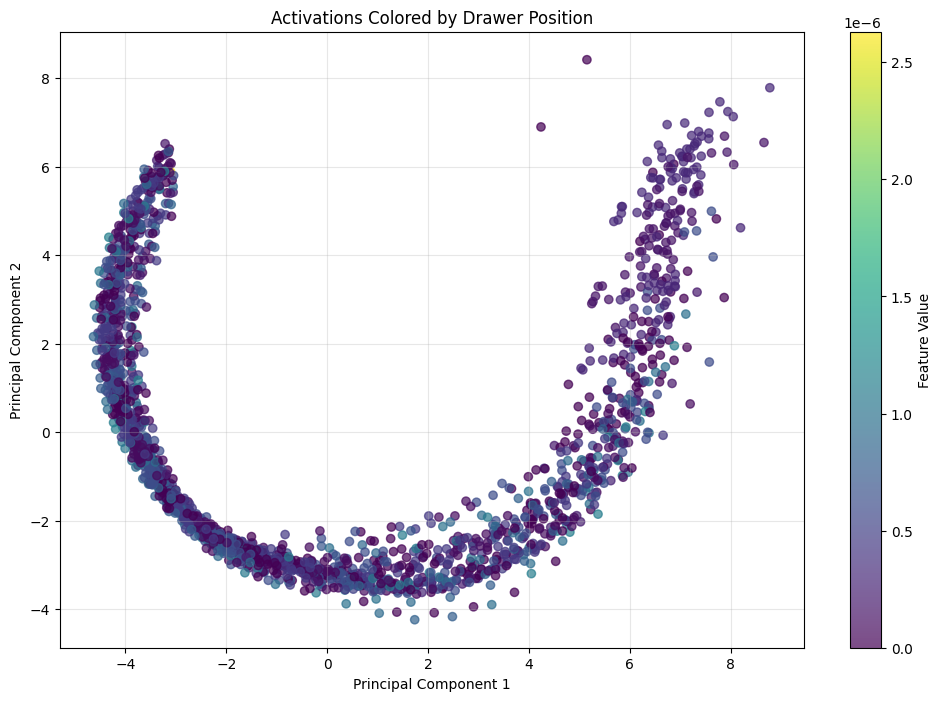

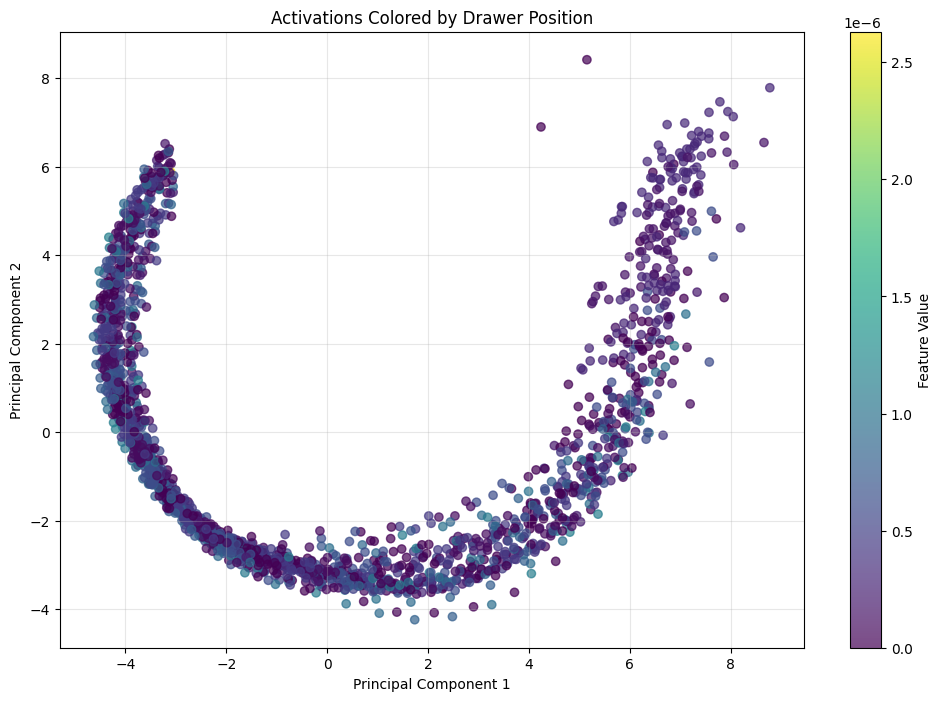

In [100]:
visualizer.plot_projected_activations_by_feature(
    projected_activations, 
    filtered_dataset.get_flattened_feature('drawer_position'),
    title="Activations Colored by Drawer Position"
)

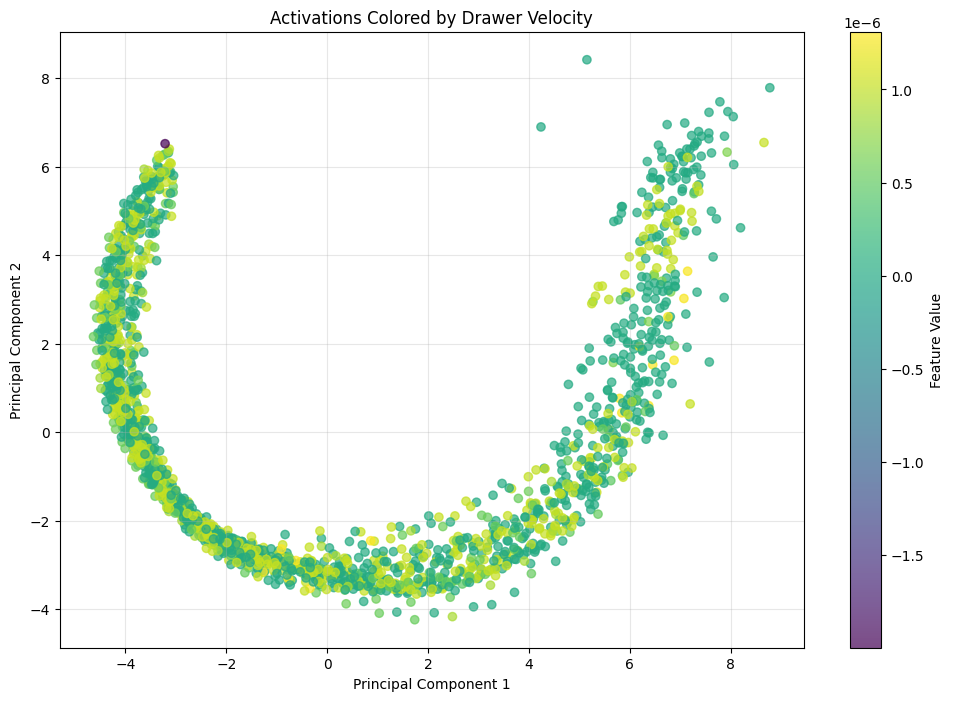

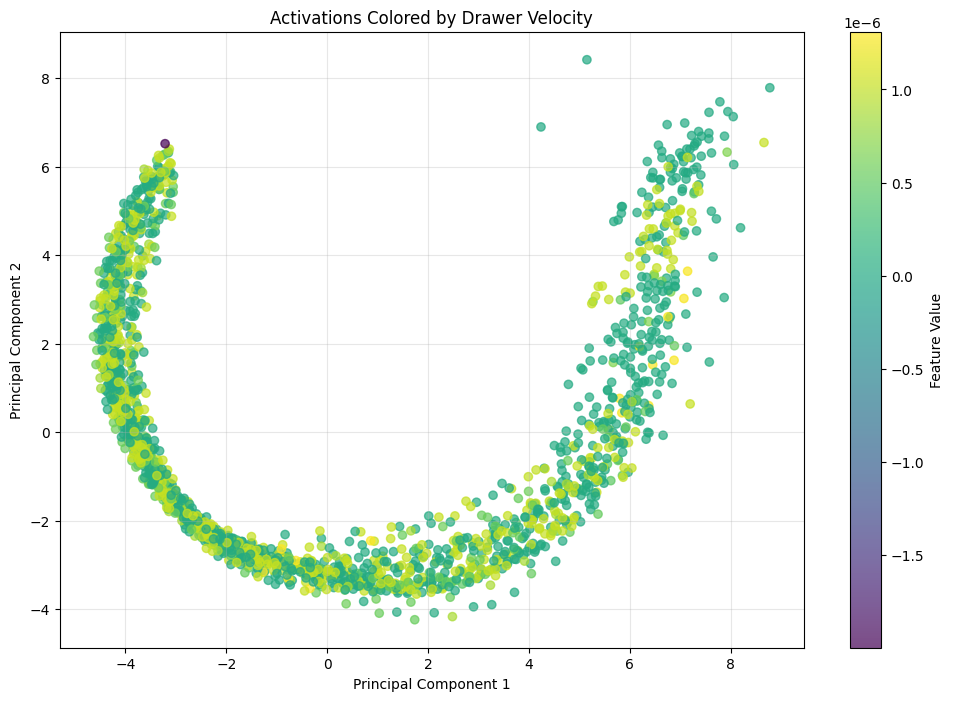

In [101]:
visualizer.plot_projected_activations_by_feature(
    projected_activations, 
    filtered_dataset.get_flattened_feature('drawer_velocity'),
    title="Activations Colored by Drawer Velocity"
)

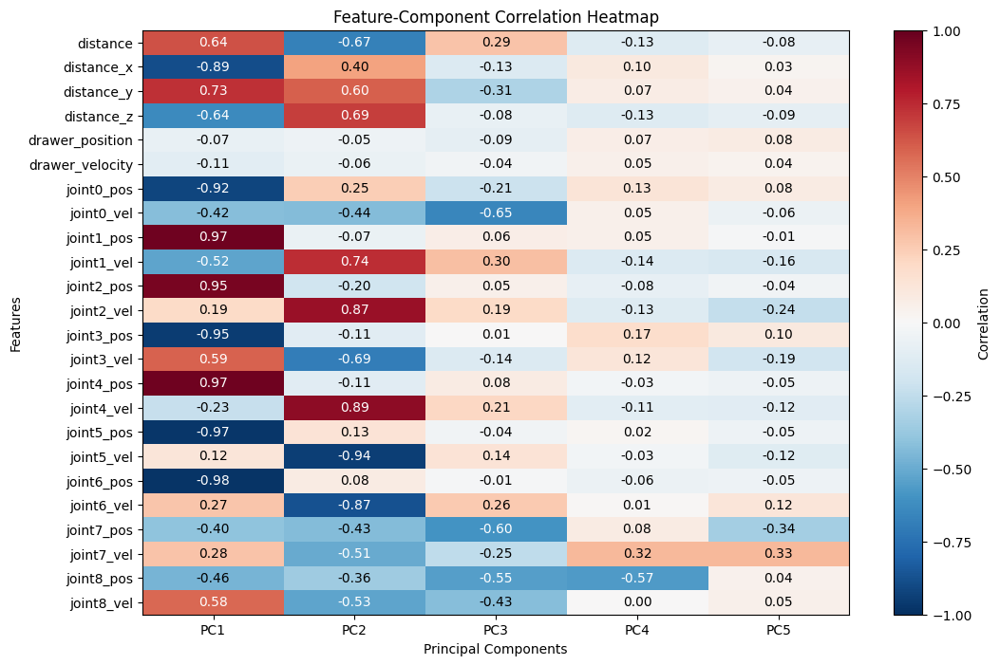

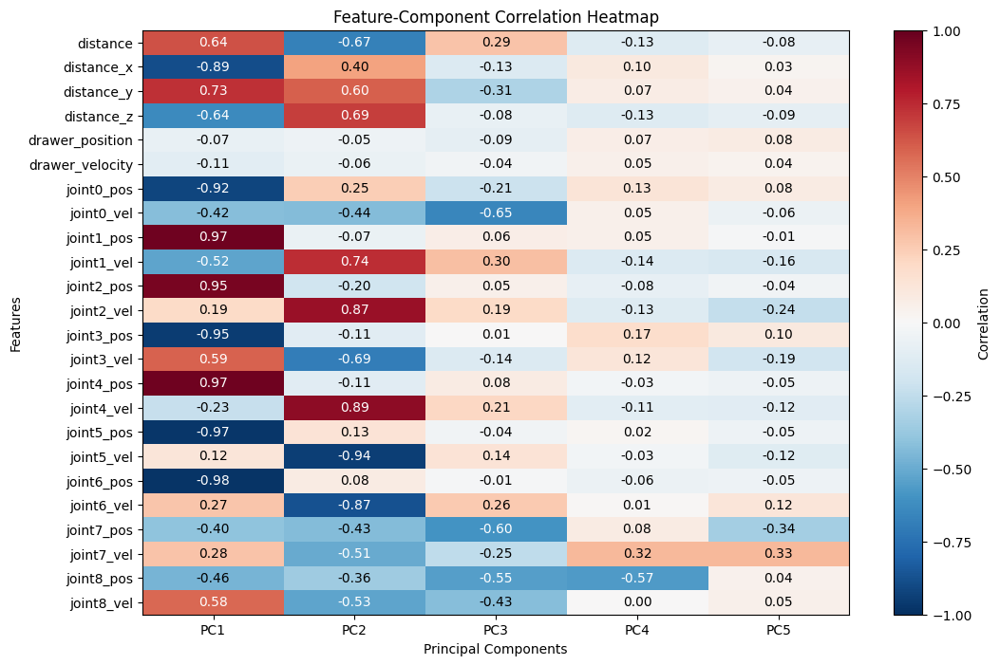

In [102]:
visualizer.plot_feature_component_correlation_heatmap(feature_correlations, features)

- PC1 appears to be the 'perception' component where it is sensitive to distance to target and overall joint positions
- PC2 appears to be the 'locomotion' component where it is sensitive to joint velocities, and negatively correlated with distance to target (i.e. it seeks to minimize distance to target)
- the rest of the PCs have smaller correlations, but it seems most are on joint 7 and 8 which are the grippers
- drawer position and velocity have little to no correlation with the PCs, which makes sense as we filtered the dataset for the 'approaching' phase

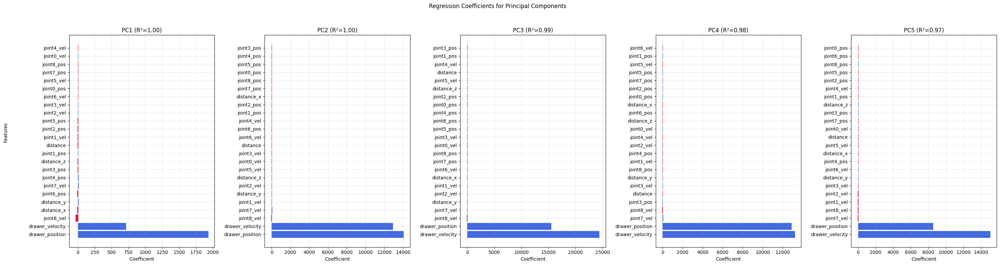

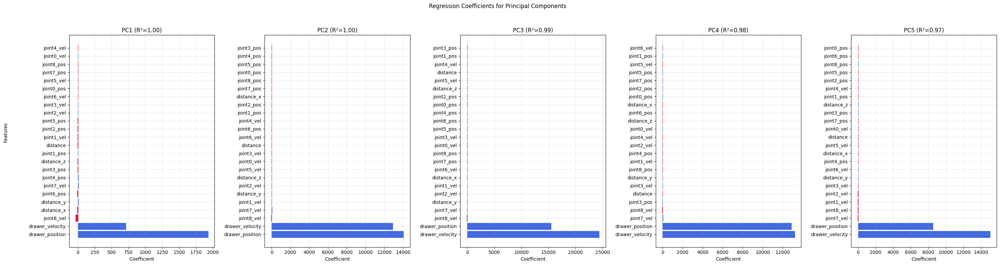

In [103]:
visualizer.plot_regression_coefficients(regression_results, features)

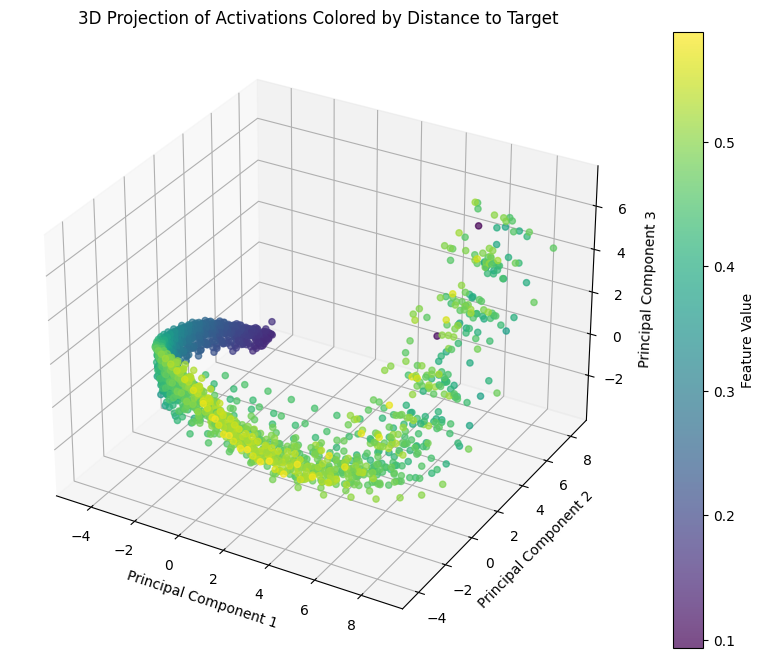

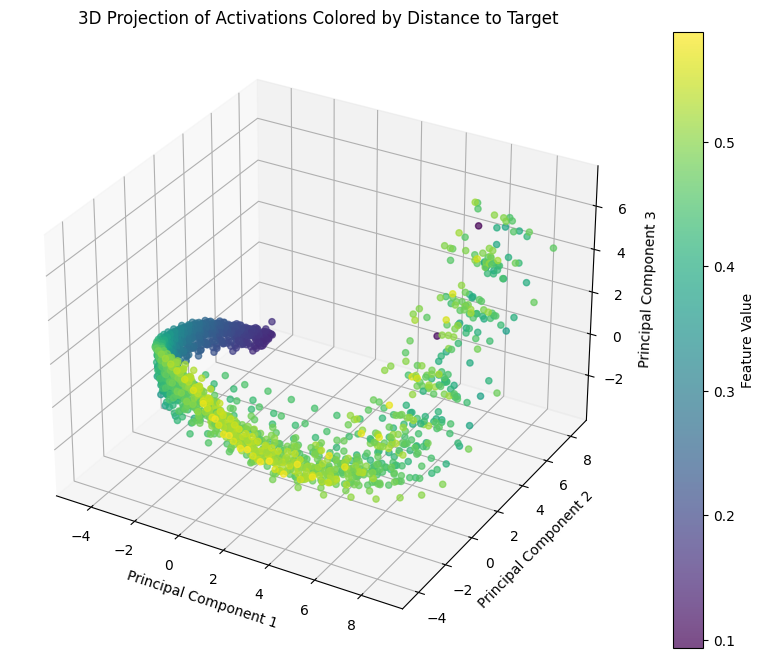

In [104]:
visualizer.plot_3d_projected_activations(
    projected_activations, 
    feature_values=filtered_dataset.get_flattened_feature('distance'),
    title="3D Projection of Activations Colored by Distance to Target"
)

## Comments
- PCA is focused on variance rather than phase separation, maybe try some form of clustering to discover the phases?